In [1]:
import os
import mne
import bambi
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import scipy.stats as stats
import numpy as np
import pandas as pd
import pickle
import plotly.graph_objs as go
import ipywidgets as widgets


WARNING (pytensor.configdefaults): g++ not available, if using conda: `conda install m2w64-toolchain`
WARNING (pytensor.configdefaults): g++ not detected!  PyTensor will be unable to compile C-implementations and will default to Python. Performance may be severely degraded. To remove this warning, set PyTensor flags cxx to an empty string.
WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


# Load eeg and behavioral data

In [86]:
# Load eeg data
folder_path = 'preprocessed_data'
file_list = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.fif')]
raw_data_list = []
for file_path in file_list:
    raw_data = mne.io.read_raw_fif(file_path)
    raw_data_list.append(raw_data) # raw_data_list is a list of raw data
# Load behavioral data
rawdata = pd.read_csv('results/beh_preprocessed.csv',sep='\t')

Opening raw data file preprocessed_data\sub-001_pre.fif...


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\186065705.py:6: RuntimeWarning:

This filename (preprocessed_data\sub-001_pre.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz



    Range : 0 ... 548320 =      0.000 ...  1070.938 secs
Ready.
Opening raw data file preprocessed_data\sub-003_pre.fif...


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\186065705.py:6: RuntimeWarning:

This filename (preprocessed_data\sub-003_pre.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz



    Range : 0 ... 566517 =      0.000 ...  1106.479 secs
Ready.
Opening raw data file preprocessed_data\sub-004_pre.fif...


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\186065705.py:6: RuntimeWarning:

This filename (preprocessed_data\sub-004_pre.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz



    Range : 0 ... 610426 =      0.000 ...  1192.238 secs
Ready.
Opening raw data file preprocessed_data\sub-005_pre.fif...


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\186065705.py:6: RuntimeWarning:

This filename (preprocessed_data\sub-005_pre.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz



    Range : 0 ... 625694 =      0.000 ...  1222.059 secs
Ready.
Opening raw data file preprocessed_data\sub-006_pre.fif...


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\186065705.py:6: RuntimeWarning:

This filename (preprocessed_data\sub-006_pre.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz



    Range : 0 ... 656373 =      0.000 ...  1281.979 secs
Ready.
Opening raw data file preprocessed_data\sub-007_pre.fif...


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\186065705.py:6: RuntimeWarning:

This filename (preprocessed_data\sub-007_pre.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz



    Range : 0 ... 787435 =      0.000 ...  1537.959 secs
Ready.
Opening raw data file preprocessed_data\sub-008_pre.fif...


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\186065705.py:6: RuntimeWarning:

This filename (preprocessed_data\sub-008_pre.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz



    Range : 0 ... 594421 =      0.000 ...  1160.979 secs
Ready.
Opening raw data file preprocessed_data\sub-009_pre.fif...


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\186065705.py:6: RuntimeWarning:

This filename (preprocessed_data\sub-009_pre.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz



    Range : 0 ... 654304 =      0.000 ...  1277.938 secs
Ready.
Opening raw data file preprocessed_data\sub-010_pre.fif...


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\186065705.py:6: RuntimeWarning:

This filename (preprocessed_data\sub-010_pre.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz



    Range : 0 ... 560844 =      0.000 ...  1095.398 secs
Ready.
Opening raw data file preprocessed_data\sub-011_pre.fif...


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\186065705.py:6: RuntimeWarning:

This filename (preprocessed_data\sub-011_pre.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz



    Range : 0 ... 646000 =      0.000 ...  1261.719 secs
Ready.
Opening raw data file preprocessed_data\sub-012_pre.fif...


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\186065705.py:6: RuntimeWarning:

This filename (preprocessed_data\sub-012_pre.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz



    Range : 0 ... 585215 =      0.000 ...  1142.998 secs
Ready.
Opening raw data file preprocessed_data\sub-013_pre.fif...


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\186065705.py:6: RuntimeWarning:

This filename (preprocessed_data\sub-013_pre.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz



    Range : 0 ... 592854 =      0.000 ...  1157.918 secs
Ready.
Opening raw data file preprocessed_data\sub-014_pre.fif...


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\186065705.py:6: RuntimeWarning:

This filename (preprocessed_data\sub-014_pre.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz



    Range : 0 ... 613938 =      0.000 ...  1199.098 secs
Ready.
Opening raw data file preprocessed_data\sub-015_pre.fif...


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\186065705.py:6: RuntimeWarning:

This filename (preprocessed_data\sub-015_pre.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz



    Range : 0 ... 772412 =      0.000 ...  1508.617 secs
Ready.
Opening raw data file preprocessed_data\sub-016_pre.fif...


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\186065705.py:6: RuntimeWarning:

This filename (preprocessed_data\sub-016_pre.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz



    Range : 0 ... 590949 =      0.000 ...  1154.197 secs
Ready.
Opening raw data file preprocessed_data\sub-017_pre.fif...


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\186065705.py:6: RuntimeWarning:

This filename (preprocessed_data\sub-017_pre.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz



    Range : 0 ... 548300 =      0.000 ...  1070.898 secs
Ready.


In [89]:
def raw2epoch(raw, locked, tmin, tmax, baseline, picks = ['CPz','CP1','CP2']):
    '''
    the function to transform raw eeg data to epoch data
    ---------------------------------------------
    params:
        raw: raw data of one subject
        locked: the time point to lock the epoch, 'stim', 'cue', 'resp'
        picks: the channels to pick, default is ['CPz','CP1','CP2']
        tmin: the start time of epoch
        tmax: the end time of epoch
        baseline: the baseline of epoch
    ---------------------------------------------
    return: 
        (evoked1, evoked2): tuple of numpy array
            evoked1: evoked data of condition 1
            evoked2: evoked data of condition 2
    '''
    # Create events
    event, event_dict = mne.events_from_annotations(raw,event_id={
            'Stimulus/S  5': 2,
            'Stimulus/S  6': 3,
            'Stimulus/S 10': 4,
            'Stimulus/S 11': 5,
            'Stimulus/S 20': 6,
            'Stimulus/S 21': 7,
            'Stimulus/S 30': 8,
            'Stimulus/S 31': 9,
            'Stimulus/S 40': 10,
            'Stimulus/S 41': 11,
            'Stimulus/S 74': 13,
            'Stimulus/S 75': 14,
            'Stimulus/S 76': 15,})
    # Create epochs
    # locked to stimulus
    if locked == 'stim':
        cond1 = ['Stimulus/S 10', 'Stimulus/S 11', 'Stimulus/S 20', 'Stimulus/S 21']
        cond2 = ['Stimulus/S 30', 'Stimulus/S 31', 'Stimulus/S 40', 'Stimulus/S 41']
        epoch = mne.Epochs(raw, 
                    event, 
                    event_id=event_dict , 
                    tmin=tmin,
                    tmax=tmax,
                    baseline = baseline, 
                    preload=True, 
                    picks=picks)
        # transform to evoked data(numpy)
        evoked1 = epoch[cond1].get_data()
        evoked2 = epoch[cond2].get_data()
        evoked1 = np.mean(evoked1,axis=1)
        evoked2 = np.mean(evoked2,axis=1)
    # locked to cue
    elif locked == 'cue':
        cond1 = ['Stimulus/S 74', 'Stimulus/S 75']
        cond2 = ['Stimulus/S 76']
        epoch = mne.Epochs(raw, 
                    event, 
                    event_id=event_dict , 
                    tmin= tmin,
                    tmax= tmax,
                    baseline = baseline,
                    preload=True, 
                    picks=picks)
        # transform to evoked data(numpy)
        evoked1 = epoch[cond1].get_data()
        evoked2 = epoch[cond2].get_data()
        evoked1 = np.mean(evoked1,axis=1)
        evoked2 = np.mean(evoked2,axis=1)
    # locked to response
    elif locked == 'resp':    
        cond1 = ['Stimulus/S  5']
        cond2 = ['Stimulus/S  6']
        epoch = mne.Epochs(raw, 
                    event, 
                    event_id=event_dict , 
                    tmin=tmin,
                    tmax=tmax,
                    baseline = baseline, 
                    preload=True, 
                    picks=picks)
        # transform to evoked data(numpy)
        evoked1 = epoch[cond1].get_data()
        evoked2 = epoch[cond2].get_data()
        # average across channels(Cp1, Cp2, Cpz)
        evoked1 = np.mean(evoked1,axis=1)
        evoked2 = np.mean(evoked2,axis=1)
    return (evoked1, evoked2) # tuple of numpy array

In [96]:
def ERP_pop(raw_data_list, locked, **kwargs):
    '''
    the function to calculate ERP of all subjects
    ---------------------------------------------
    params:
        raw_data_list: list of raw data of all subjects
        locked: the time point to lock the epoch, 'stim', 'cue', 'resp'
    ---------------------------------------------
    return:
        (mean1, std1, mean2, std2): tuple of numpy array
            mean1: mean of condition 1
            std1: std of condition 1
            mean2: mean of condition 2
            std2: std of condition 2
    '''
    # transform raw data to epoch data
    result_list = [raw2epoch(raw, locked, **kwargs) for raw in raw_data_list]
    # get evoked data of condition 1 and condition 2
    evokeds1 = [result_list[0] for result_list in result_list]
    evokeds2 = [result_list[1] for result_list in result_list]
    # average across tirals(number of epochs)
    evokeds1 = [np.mean(evoked1,axis=0) for evoked1 in evokeds1]
    evokeds2 = [np.mean(evoked2,axis=0) for evoked2 in evokeds2]
    # transform to numpy array
    evoked1 = [np.array(evokeds1) for evokeds1 in evokeds1]
    evoked2 = [np.array(evokeds2) for evokeds2 in evokeds2]
    # average across subjects
    mean1 = np.mean(evoked1, axis=0)
    std1 = np.std(evoked1, axis=0)
    mean2 = np.mean(evoked2, axis=0)
    std2 = np.std(evoked2, axis=0)

    return (mean1, std1, mean2, std2) # tuple of numpy array

In [97]:
cpp_stim = ERP_pop(raw_data_list, 'stim', tmin=-1.5, tmax=1.5, baseline = (-1.5,-1))
cpp_cue = ERP_pop(raw_data_list, 'cue', tmin=-0.5, tmax=3, baseline = (-0.5,0))
cpp_resp = ERP_pop(raw_data_list, 'resp', tmin=-2, tmax=1, baseline = (None,0))

Used Annotations descriptions: ['Stimulus/S  5', 'Stimulus/S  6', 'Stimulus/S 10', 'Stimulus/S 11', 'Stimulus/S 20', 'Stimulus/S 21', 'Stimulus/S 30', 'Stimulus/S 31', 'Stimulus/S 40', 'Stimulus/S 41', 'Stimulus/S 74', 'Stimulus/S 75', 'Stimulus/S 76']
Not setting metadata
864 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 864 events and 1537 original time points ...
0 bad epochs dropped
Used Annotations descriptions: ['Stimulus/S  5', 'Stimulus/S  6', 'Stimulus/S 10', 'Stimulus/S 11', 'Stimulus/S 20', 'Stimulus/S 21', 'Stimulus/S 30', 'Stimulus/S 31', 'Stimulus/S 40', 'Stimulus/S 41', 'Stimulus/S 74', 'Stimulus/S 75', 'Stimulus/S 76']
Not setting metadata
864 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 864 events and 1537 original time points ...
0 bad epochs dropped
Used Annotations descriptions: ['Stimulus/S  5', 'Stimulus/S  6', 'Stimulus/S 10', 'Stimulus

# Get ERP data

In [4]:
if os.path.exists('results/cpp_stim.pickle') and os.path.exists('results/cpp_cue.pickle') and os.path.exists('results/cpp_resp.pickle'):
    with open('results/cpp_stim.pickle', 'rb') as f:
        cpp_stim = pickle.load(f)
    with open('results/cpp_cue.pickle', 'rb') as f:
        cpp_cue = pickle.load(f)
    with open('results/cpp_resp.pickle', 'rb') as f:
        cpp_resp = pickle.load(f)
else:
    # Get cpp ERP data of all subjects according to different locked time points
    cpp_stim = ERP_pop(raw_data_list, 'stim', tmin=-1.5, tmax=1.5, baseline = (-1.5,-1))
    cpp_cue = ERP_pop(raw_data_list, 'cue', tmin=-0.5, tmax=3, baseline = (-0.5,0))
    cpp_resp = ERP_pop(raw_data_list, 'resp', tmin=-2, tmax=1, baseline = (None,0))
    # Save the data
    with open('results/cpp_stim.pickle', 'wb') as f:
        pickle.dump(cpp_stim, f)
    with open('results/cpp_cue.pickle', 'wb') as f:
        pickle.dump(cpp_cue, f)
    with open('results/cpp_resp.pickle', 'wb') as f:
        pickle.dump(cpp_resp, f)

# Plot ERP figure

## Stim-locked ERP

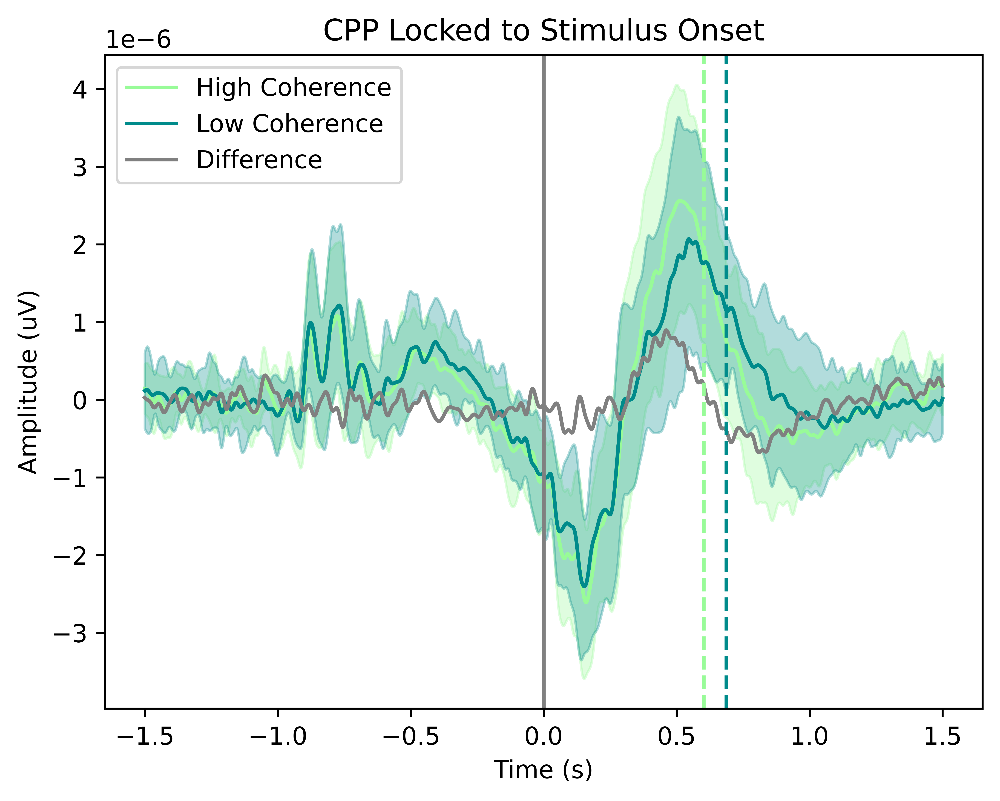

In [98]:
# transform points to time 
x = np.arange(len(cpp_stim[0]))/512-1.5
# get mean and std of each condition
mean1 = cpp_stim[0]
std1 = cpp_stim[1]
mean2 = cpp_stim[2]
std2 = cpp_stim[3]
# set figure size and dpi
plt.subplots(#figsize=(10,10),
             dpi=1000)
# plot mean ERP of each condition and their difference
plt.plot(x, 
         mean1, 
         label='High Coherence',
         color = 'PaleGreen')
plt.plot(x, 
         mean2, 
         label='Low Coherence',
         color='DarkCyan')
plt.plot(x, 
         mean1-mean2, 
         label='Difference',
         color='grey')
# plot std of each condition
plt.fill_between(x, 
                 mean1 -std1,  
                 mean1 +std1,
                 alpha=0.3,
                 color = 'PaleGreen')
plt.fill_between(x, 
                 mean2 -std2,  
                 mean2 +std2,
                 alpha=0.3,
                 color='DarkCyan')
# plot vertical lines to indicate the time point of peak amplitude
rt_hc = rawdata.loc[rawdata['coherence']=='high','rt'].mean()+0.2
rt_lc = rawdata.loc[rawdata['coherence']=='low','rt'].mean()+0.2
plt.axvline(x=rt_hc, 
            color='PaleGreen', 
            #alpha=0.5,
            linestyle='--')
plt.axvline(x=rt_lc, 
            color='DarkCyan', 
            #alpha=0.5,
            linestyle='--')
# plot horizontal and vertical lines to indicate the time point of stimulus onset
#plt.axhline(y=0, 
#            color='grey', 
#            alpha=0.3,
#            linestyle='--')
plt.axvline(x=0, 
            color='grey',                         
            #alpha=0.3,
            linestyle='-')
# set title and labels
plt.title('CPP Locked to Stimulus Onset')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.legend()
# save figure
plt.savefig('figures/erp_cpp_stim.png',
            dpi=1000)
plt.show()

## Cue-locked ERP

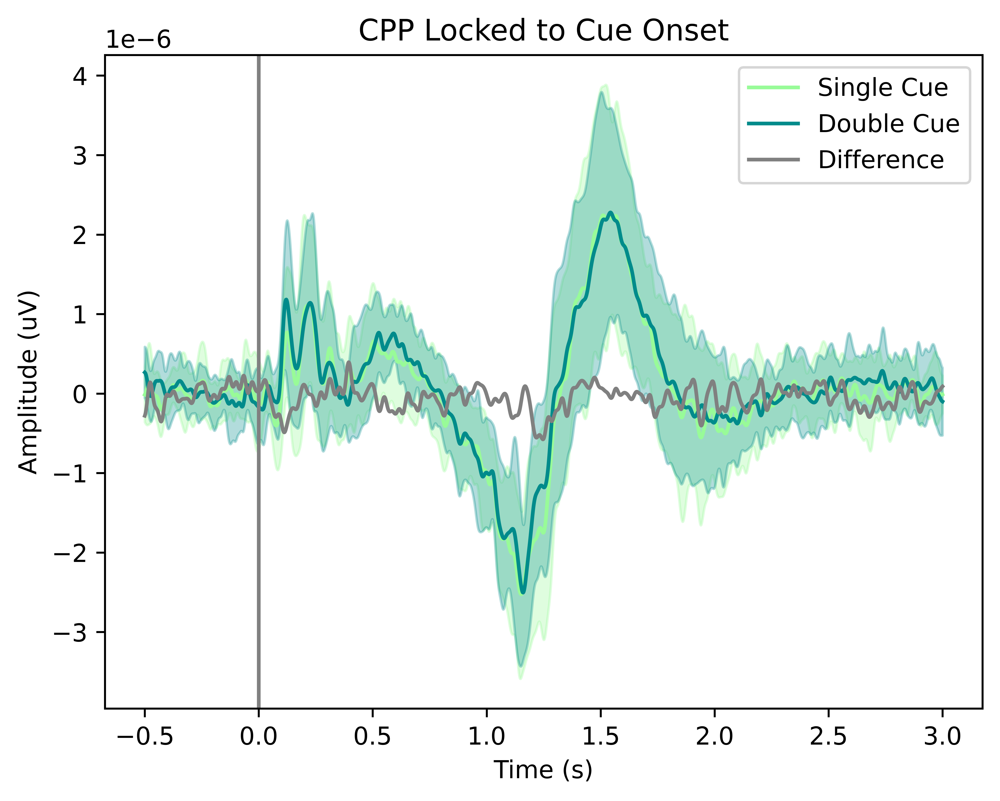

In [ ]:
# transform points to time
x = np.arange(len(cpp_cue[0]))/512-0.5
# get mean and std of each condition
mean1 = cpp_cue[0]
std1 = cpp_cue[1]
mean2 = cpp_cue[2]
std2 = cpp_cue[3]
# set figure size and dpi
plt.subplots(#figsize=(10,10),
             dpi=1000)
plt.plot(x, 
         mean1, 
         label='Single Cue',
         color = 'PaleGreen')
plt.plot(x, 
         mean2, 
         label='Double Cue',
         color='DarkCyan')
plt.plot(x, 
         mean1-mean2, 
         label='Difference',
         color='grey')
# plot std of each condition
plt.fill_between(x, 
                 mean1 -std1,  
                 mean1 +std1,
                 alpha=0.3,
                 color = 'PaleGreen')
plt.fill_between(x, 
                 mean2 -std2,  
                 mean2 +std2,
                 alpha=0.3,
                 color='DarkCyan')
# plot horizontal and vertical lines to indicate the time point of cue onset
#plt.axhline(y=0, 
#            color='grey', 
#            alpha=0.3,
#            linestyle='--')
plt.axvline(x=0, 
            color='grey',                         
            #alpha=0.3,
            linestyle='-')
# set title and labels
plt.title('CPP Locked to Cue Onset')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.legend()
# save figure
plt.savefig('figures/erp_cpp_cue.png',
            dpi=1000)
plt.show()

## Resp-locked ERP

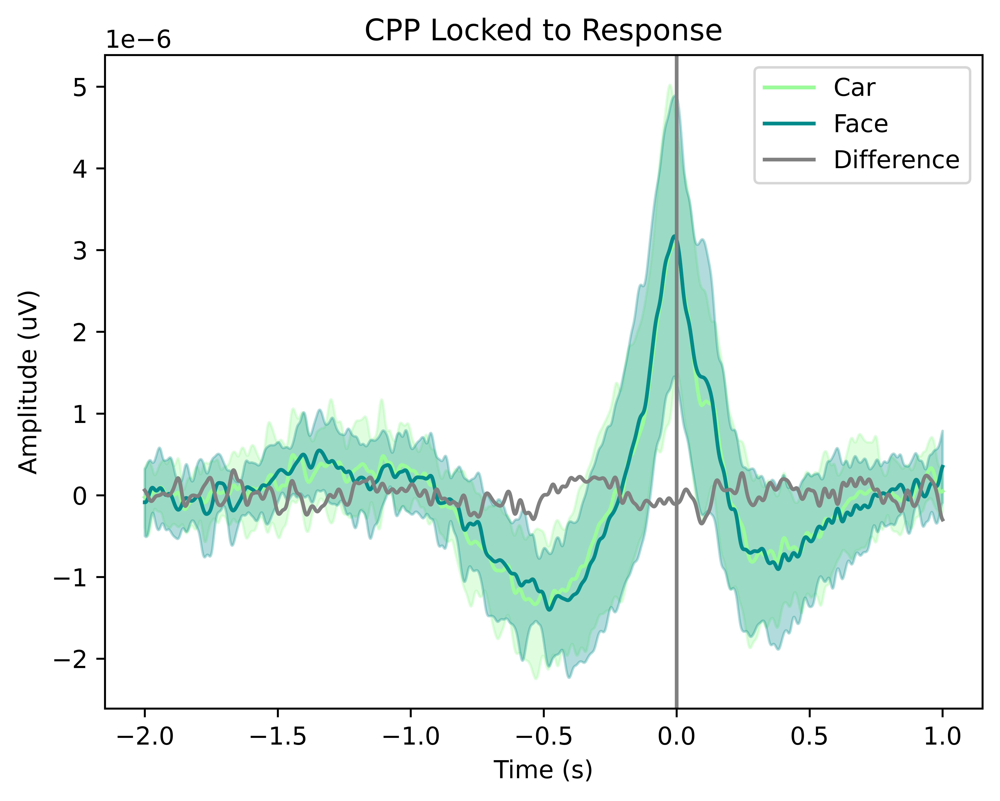

In [ ]:
# transform points to time 
x = np.arange(len(cpp_resp[0]))/512-2
# get mean and std of each condition
mean1 = cpp_resp[0]
std1 = cpp_resp[1]
mean2 = cpp_resp[2]
std2 = cpp_resp[3]
# set figure size and dpi
plt.subplots(#figsize=(10,10),
             dpi=1000)
# plot mean ERP of each condition and their difference
plt.plot(x, 
         mean1, 
         label='Car',
         color = 'PaleGreen')
plt.plot(x, 
         mean2, 
         label='Face',
         color='DarkCyan')
plt.plot(x, 
         mean1-mean2, 
         label='Difference',
         color='grey')
# plot std of each condition
plt.fill_between(x, 
                 mean1 -std1,  
                 mean1 +std1,
                 alpha=0.3,
                 color = 'PaleGreen')
plt.fill_between(x, 
                 mean2 -std2,  
                 mean2 +std2,
                 alpha=0.3,
                 color='DarkCyan')
# plot horizontal and vertical lines to indicate the time point of response
#plt.axhline(y=0, 
#            color='grey', 
#            alpha=0.3,
#            linestyle='--')
plt.axvline(x=0, 
            color='grey',                         
            #alpha=0.3,
            linestyle='-')
# set title and labels
plt.title('CPP Locked to Response')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.legend()
# save figure
plt.savefig('figures/erp_cpp_resp.png',
            dpi=1000)
plt.show()

# Get resp-locked eeg data

In [107]:
def epoch2df(raw_data_list,rawdata,tmin,tmax,baseline,locked='resp',picks=['CPz','CP1','CP2']):
    '''
    transform epoch data to dataframe and merge them into behavioral dataframe
    ----------
    params:
        raw_data_list: list of raw data
        rawdata: behavioral dataframe
        tmin: start time of epoch
        tmax: end time of epoch
        baseline: baseline of epoch
        locked: 'resp' or 'stim'
        picks: channels to be extracted

    ----------
    return:
        dfs: dataframe of merging epoch and behavioral data
    '''
    # initialize dataframe
    dfs = pd.DataFrame()
    # loop through each subject
    for i in range(len(raw_data_list)):
        # get raw eeg data 
        raw = raw_data_list[i]
        # get behavioral data of each subject
        data = rawdata.loc[rawdata['subj_idx']==np.unique(rawdata['subj_idx'])[i],:]
        
        if locked == 'resp':
            # get epoch data
            # get event
            event, event_dict = mne.events_from_annotations(raw,event_id={
                        'Stimulus/S  5': 2,
                        'Stimulus/S  6': 3})
            # get epoch data
            epoch = mne.Epochs(raw, 
                    event, 
                    event_id=event_dict , 
                    tmin=tmin,
                    tmax=tmax,
                    baseline = baseline,
                    preload=True, 
                    picks=picks)
            # get epoch data and average across channels
            epoch_df = pd.DataFrame(epoch.get_data().mean(axis=1))
            
            # process mismatched epoch and behavioral data
            #
            if len(data)!= len(event):
                # get event id
                new_events = event[:,2].tolist()
                # transform string to int for comparison
                data.loc[data['key_press']=='car','key_press'] = 2
                data.loc[data['key_press']=='face','key_press'] = 3
                # get the index of mismatched event
                boo = np.zeros(len(data)) # 1 for matched, 0 for mismatched
                diff_len = len(data) - len(new_events)
                new_events += [0] * diff_len
                # get the index of mismatched event to store in loc
                loc = [] 
                # loop through each event to check if it is matched
                for i in range(len(boo)):
                    boo = np.array(data['key_press'] == new_events, dtype=np.int32)
                    # add new event to new_events to match the length
                    if not boo[i]:
                        # shift the events after mismatched event to the next trial
                        new_events[i+1:] = new_events[i:-1]
                        # store the index of added event in loc
                        loc.append(i)
                        # add new event to the mismatched event
                        new_events[i] = data.iloc[i]['key_press']
                        # check if the new event is matched
                        boo[i] = 1 if data.iloc[i]['key_press'] == new_events[i] else 0
                # drop the nan response
                data.reset_index(drop=True, inplace=True)
                # drop the mismatched event
                data = data.iloc[~data.index.isin(loc)]
                # transform int back to string
                data.loc[data['key_press']==2,'key_press'] = 'car'
                data.loc[data['key_press']==3,'key_press'] = 'face' 
            else:
                # drop the nan response
                data.reset_index(drop=True, inplace=True)   
        else:
            # get epoch data
            # get event
            event, event_dict = mne.events_from_annotations(raw,event_id={
                'Stimulus/S 10': 4,
                'Stimulus/S 11': 5,
                'Stimulus/S 20': 6,
                'Stimulus/S 21': 7,
                'Stimulus/S 30': 8,
                'Stimulus/S 31': 9,
                'Stimulus/S 40': 10,
                'Stimulus/S 41': 11,})
            # get epoch data
            epoch = mne.Epochs(raw, 
                    event, 
                    event_id=event_dict , 
                    tmin=tmin, 
                    tmax=tmax,
                    baseline = baseline,
                    preload=True, 
                    picks=picks)
            # get epoch data and average across channels
            epoch_df = pd.DataFrame(epoch.get_data().mean(axis=1))
            
            # process mismatched epoch and behavioral data
            #
            if len(data)!= len(event):
                new_events = [1 if x == 4 or x == 5 else 2 if x == 6 or x == 7 else 3 if x == 8 or x == 9 else 4 for x in event[:,2].tolist()]
                boo = np.zeros(len(data))

                
                diff_len = len(data) - len(new_events)
                new_events += [4] * diff_len
                
                boo = np.array(data['condition'] == new_events, dtype=np.int32)

                loc = []
                for i in range(len(boo)):
                    boo = np.array(data['condition'] == new_events, dtype=np.int32)
                    if not boo[i]:
                        new_events[i+1:] = new_events[i:-1]
                        loc.append(i)
                        new_events[i] = data.iloc[i]['condition']
                        boo[i] = 1 if data.iloc[i]['condition'] == new_events[i] else 0
                data.reset_index(drop=True, inplace=True)
                data = data.iloc[~data.index.isin(loc)]
            else:
                data = data.reset_index(drop=True)

                
        # merge epoch and behavioral data along the column
        df = pd.concat([data,epoch_df],axis=1)
        # merge each subject's data
        dfs = pd.concat([dfs,df]).reset_index(drop=True)
        # drop nan
        dfs.dropna(axis=0,how='any',inplace=True)
        # drop outlier
        dfs = dfs.groupby(['subj_idx']).apply(lambda x: x[(x['rt'] > x['rt'].mean() - x['rt'].std()*3) & (x['rt'] < x['rt'].mean() + x['rt'].std()*3)]).reset_index(drop=True)
    return dfs

In [34]:
# get epoch data
if os.path.exists('results/dfs_resp.csv') and os.path.exists('results/dfs_stim.csv'):
    dfs_resp = pd.read_csv('results/dfs_resp.csv')
    dfs_stim = pd.read_csv('results/dfs_stim.csv')
else:
    dfs_resp = epoch2df(raw_data_list,rawdata=rawdata,locked='resp')
    dfs_stim = epoch2df(raw_data_list,rawdata=rawdata,locked='stim')
    dfs_resp.to_csv('results/dfs_resp.csv',index=False)
    dfs_stim.to_csv('results/dfs_stim.csv',index=False)
# rename the column
dfs_resp.rename(columns={col:int(col) for col in dfs_resp.columns if col.isdigit()} ,inplace=True)
dfs_stim.rename(columns={col:int(col) for col in dfs_stim.columns if col.isdigit()} ,inplace=True)

In [145]:
dfs_n170_stim = epoch2df(raw_data_list,rawdata=rawdata,locked='stim',picks =['PO7', 'P7', 'P8','PO8'],tmin=-1.5,tmax=1.5,baseline=(-1.5,-1))

Used Annotations descriptions: ['Stimulus/S 10', 'Stimulus/S 11', 'Stimulus/S 20', 'Stimulus/S 21', 'Stimulus/S 30', 'Stimulus/S 31', 'Stimulus/S 40', 'Stimulus/S 41']
Not setting metadata
288 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 288 events and 1537 original time points ...
0 bad epochs dropped
Used Annotations descriptions: ['Stimulus/S 10', 'Stimulus/S 11', 'Stimulus/S 20', 'Stimulus/S 21', 'Stimulus/S 30', 'Stimulus/S 31', 'Stimulus/S 40', 'Stimulus/S 41']
Not setting metadata
288 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Loading data for 288 events and 1537 original time points ...
0 bad epochs dropped
Used Annotations descriptions: ['Stimulus/S 10', 'Stimulus/S 11', 'Stimulus/S 20', 'Stimulus/S 21', 'Stimulus/S 30', 'Stimulus/S 31', 'Stimulus/S 40', 'Stimulus/S 41']
Not setting metadata
282 matching events found
Applying baseline correction (mode: mean)
0 pro

# check the difference between conditions

In [109]:
def sigtest(cond1,cond2,feature):
    '''
    This function is used to test the significance of the difference between two conditions
    the time window is 0.1s and the slide window is 0.01s
    ----------
    params:
        cond1: dataframe of condition 1
        cond2: dataframe of condition 2
        feature: feature to be tested
    ----------
    return:
        ts: time points of significant difference
    '''
    import scipy.stats as stats
    # initialize dataframe
    ts = []
    # transform time window to time points
    tw = 0.1
    tp = round((0.1*512)/2)
    # transform slide window to time points
    sw = 0.01
    sp = round(0.01*512)

    # loop through each slide window
    for i in range(round(2049/sp)):
        if i*sp+tp > 2048:
            break
        # get the feature of each slide window
        if feature == 'amplitude':
            cond1_win = cond1.iloc[:,(i*sp-tp):(i*sp+tp)].mean(axis=1)
            cond2_win = cond2.iloc[:,(i*sp-tp):(i*sp+tp)].mean(axis=1)
        elif feature == 'slope':
            cond1_win = cond1.iloc[:,(i*sp-tp):(i*sp+tp)].apply(lambda x: np.polyfit(range(len(x)),x,1)[0],axis=1) # np.ployfit(x,y,deg)[0], First order linear item
            cond2_win = cond2.iloc[:,(i*sp-tp):(i*sp+tp)].apply(lambda x: np.polyfit(range(len(x)),x,1)[0],axis=1)    
        elif feature == 'peak':
            cond1_win = cond1.iloc[:,(i*sp-tp):(i*sp+tp)].apply(lambda x: np.max(x),axis=1)
            cond2_win = cond2.iloc[:,(i*sp-tp)(i*sp+tp)].apply(lambda x: np.max(x),axis=1)
        # t-test
        _,p = stats.ttest_rel(cond1_win,cond2_win)
        # store the time points of significant difference
        if p < 0.05:
            ts.append(i*sp)
    return ts

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\3818132722.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\3818132722.py:5: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\2783463333.py:41: DeprecationWarning:

The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.



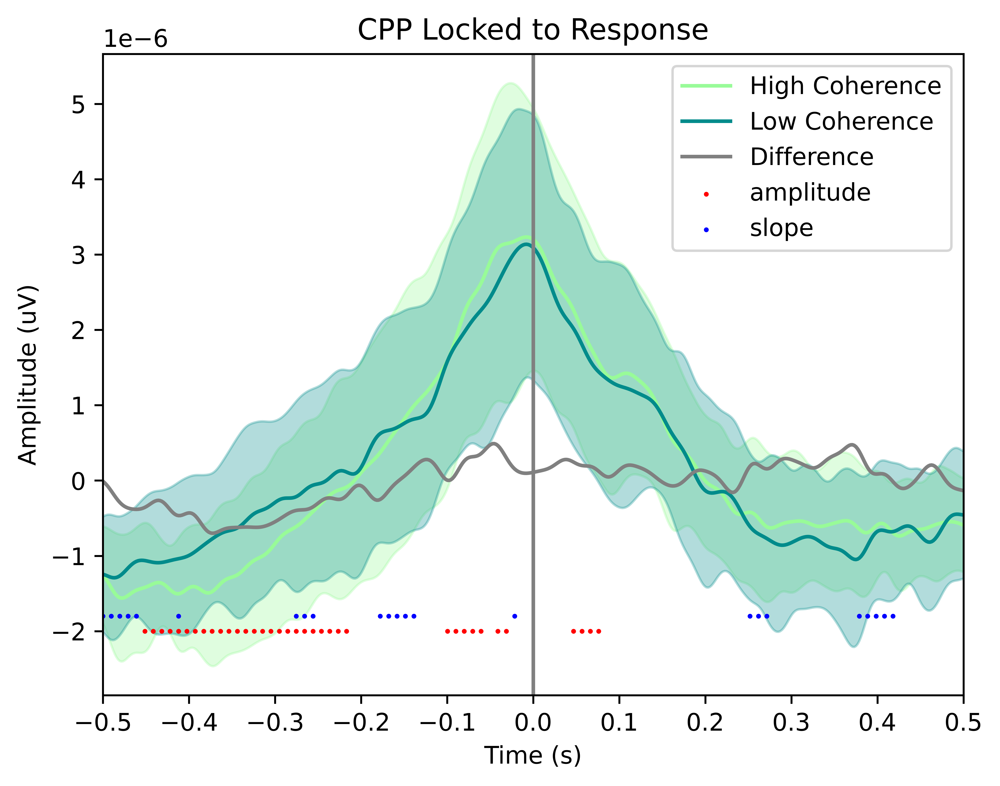

In [110]:
# transform points to time 
x =np.arange(dfs_resp.loc[:,0:].shape[1])/512-3 # numbers of time points of epoch, sample rate is 512
# get the data of each condition
cond1 = dfs_resp.loc[dfs_resp['coherence']=='high'].groupby('subj_idx').mean().reset_index().loc[:,0:2048]
cond2 = dfs_resp.loc[dfs_resp['coherence']=='low'].groupby('subj_idx').mean().reset_index().loc[:,0:2048]
# get the mean and std of each condition
mean1 = cond1.mean(axis=0)
mean2 = cond2.mean(axis=0)
std1 = cond1.std(axis=0)
std2 = cond2.std(axis=0)
# plot the data
plt.subplots(dpi=1000)
# plot the mean of each condition
plt.plot(x,mean1,color='PaleGreen',label='High Coherence')
plt.plot(x,mean2,color='DarkCyan',label='Low Coherence')
plt.plot(x,mean1-mean2,label='Difference',color='grey')
# plot the std of each condition
plt.fill_between(x,mean1 -std1,mean1 +std1,alpha=0.3,color = 'PaleGreen')
plt.fill_between(x,mean2 -std2,mean2 +std2,alpha=0.3,color='DarkCyan')
# plot horizontal and vertical lines to indicate the time point of response
plt.axvline(x=0, color='grey', linestyle='-')
# transform time window to time points
ts_amp = np.array(sigtest(cond1,cond2,'amplitude'))
ts_slp = np.array(sigtest(cond1,cond2,'slope'))
# the location of the y axis
y_amp = np.array(ts_amp) * 0 - 2e-6
y_slp = np.array(ts_slp) * 0 - 1.8e-6
# plot the time points of significant difference
plt.scatter(x=ts_amp/512-3,y=y_amp,color='red', s=1, label='amplitude')
plt.scatter(x=ts_slp/512-3,y=y_slp,color='blue', s=1, label='slope')
plt.title('CPP Locked to Response')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.legend()
plt.xticks(np.arange(-3, 1, 0.1))
plt.xlim(-0.5,0.5)
# save figure
plt.savefig('figures/erp_cpp_resp_diff.png',dpi=1000)
plt.show()

## Single-trial figure

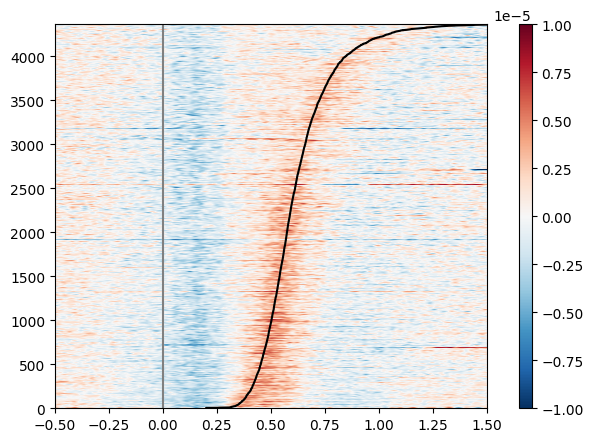

In [111]:
df_rm = dfs_stim.sort_values(by=['rt'],ascending=True)
plt.imshow(df_rm.loc[:,0:],
           origin='lower',
           cmap='RdBu_r',
           vmin=-1e-5,
           vmax=1e-5,
           aspect='auto',
           extent=[-1.5,1.5,0,len(df_rm)])
plt.plot(df_rm['rt']+0.2,range(len(df_rm)),color = 'black')
plt.axvline(x=0, color='grey', linestyle='-')
plt.xlim(-0.5,1.5)
# set title and labels
plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
cax = plt.axes([0.85, 0.1, 0.02, 0.8])
plt.colorbar(cax=cax)

plt.show()


## High and low coherence ERP

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\3038274948.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\3038274948.py:5: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\3038274948.py:39: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\3038274948.py:40: F

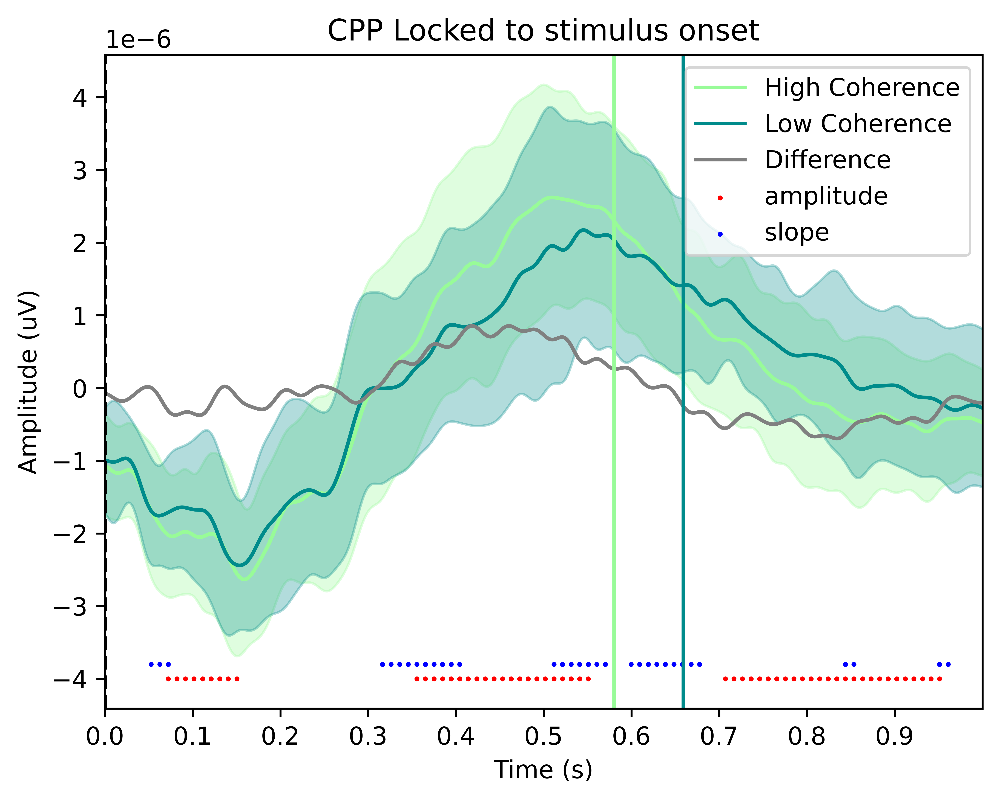

In [112]:
# transform points to time 
x =np.arange(dfs_stim.loc[:,0:].shape[1])/512-1.5 # numbers of time points of epoch, sample rate is 512
# get the data of each condition
cond1 = dfs_stim.loc[dfs_stim['coherence']=='high'].groupby('subj_idx').mean().reset_index().loc[:,0:1536]
cond2 = dfs_stim.loc[dfs_stim['coherence']=='low'].groupby('subj_idx').mean().reset_index().loc[:,0:1536]
# get the mean and std of each condition
mean1 = cond1.mean(axis=0)
mean2 = cond2.mean(axis=0)
std1 = cond1.std(axis=0)
std2 = cond2.std(axis=0)
# plot the data
plt.subplots(#figsize=(10,5),
             dpi=1000)
# plot the mean of each condition
plt.plot(x,
         mean1,
         color='PaleGreen',
         label='High Coherence')
plt.plot(x,
         mean2,
         color='DarkCyan',
         label='Low Coherence')
plt.plot(x, 
         mean1-mean2, 
         label='Difference',
         color='grey')
# plot the std of each condition
plt.fill_between(x, 
                 mean1 -std1,  
                 mean1 +std1,
                 alpha=0.3,
                 color = 'PaleGreen')
plt.fill_between(x, 
                 mean2 -std2,  
                 mean2 +std2,
                 alpha=0.3,
                 color='DarkCyan')
# plot horizontal and vertical lines to indicate the time point of response
rt_hc = dfs_stim.loc[dfs_stim['coherence']=='high'].groupby('subj_idx').mean().reset_index().loc[:,'rt']+0.2
rt_lc = dfs_stim.loc[dfs_stim['coherence']=='low'].groupby('subj_idx').mean().reset_index().loc[:,'rt']+0.2
plt.axvline(x=0, color='black', linestyle='--')
plt.axvline(x=rt_hc.mean(), color='PaleGreen', linestyle='-')
plt.axvline(x=rt_lc.mean(), color='DarkCyan', linestyle='-')

# transform time window to time points
ts_amp = np.array(sigtest(cond1,cond2,'amplitude'))
ts_slp = np.array(sigtest(cond1,cond2,'slope'))
#ts_pk = np.array(sigtest(cond1,cond2,'peak'))
# the location of the y axis
y_amp = np.array(ts_amp) * 0 - 4e-6
y_slp = np.array(ts_slp) * 0 - 3.8e-6
#y_pk = np.array(ts_pk) * 0 - 1.6e-6
# plot the time points of significant difference
plt.scatter(x=ts_amp/512-1.5,
            y=y_amp,
            color='red', 
            s=1, 
            label='amplitude')
plt.scatter(x=ts_slp/512-1.5,
            y=y_slp,
            color='blue', 
            s=1, 
            label='slope')
#plt.scatter(x=ts_pk/512-3,
#            y=y_pk,
#            color='gray', 
#            s=1, 
#            label='peak')
# set title and labels
plt.title('CPP Locked to stimulus onset')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.legend()
plt.xticks(np.arange(-3, 1, 0.1))
plt.xlim(0,1)
# save figure
#plt.savefig('figures/erp_cpp_resp_diff.png', dpi=1000)
plt.show()

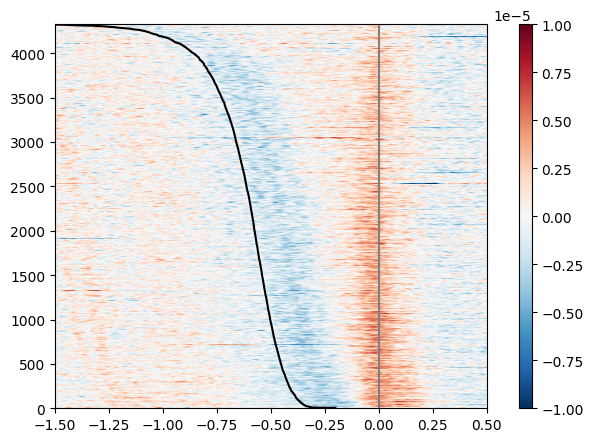

In [113]:
df_rm = dfs_resp.sort_values(by=['rt'],ascending=True)
plt.imshow(df_rm.loc[:,0:],
           origin='lower',
           cmap='RdBu_r',
           vmin=-1e-5,
           vmax=1e-5,
           aspect='auto',
           extent=[-3,1,0,len(df_rm)])
plt.plot(-df_rm['rt']-0.2,range(len(df_rm)),color = 'black')
plt.axvline(x=0, color='grey', linestyle='-')
plt.xlim(-1.5,0.5)
# set title and labels
plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
cax = plt.axes([0.85, 0.1, 0.02, 0.8])
plt.colorbar(cax=cax)

plt.show()

## n170

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\1170045320.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\1170045320.py:5: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\1170045320.py:39: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\1170045320.py:40: F

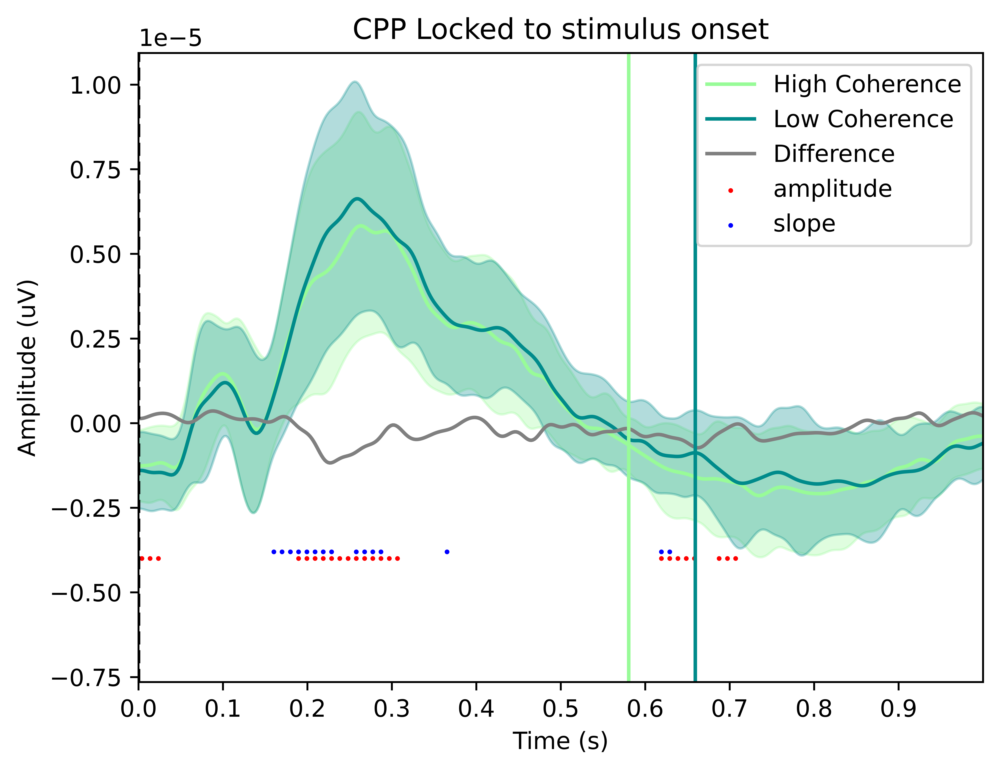

In [146]:
# transform points to time 
x =np.arange(dfs_n170_stim.loc[:,0:].shape[1])/512-1.5 # numbers of time points of epoch, sample rate is 512
# get the data of each condition
cond1 = dfs_n170_stim.loc[dfs_n170_stim['coherence']=='high'].groupby('subj_idx').mean().reset_index().loc[:,0:1536]
cond2 = dfs_n170_stim.loc[dfs_n170_stim['coherence']=='low'].groupby('subj_idx').mean().reset_index().loc[:,0:1536]
# get the mean and std of each condition
mean1 = cond1.mean(axis=0)
mean2 = cond2.mean(axis=0)
std1 = cond1.std(axis=0)
std2 = cond2.std(axis=0)
# plot the data
plt.subplots(#figsize=(10,5),
             dpi=1000)
# plot the mean of each condition
plt.plot(x,
         mean1,
         color='PaleGreen',
         label='High Coherence')
plt.plot(x,
         mean2,
         color='DarkCyan',
         label='Low Coherence')
plt.plot(x, 
         mean1-mean2, 
         label='Difference',
         color='grey')
# plot the std of each condition
plt.fill_between(x, 
                 mean1 -std1,  
                 mean1 +std1,
                 alpha=0.3,
                 color = 'PaleGreen')
plt.fill_between(x, 
                 mean2 -std2,  
                 mean2 +std2,
                 alpha=0.3,
                 color='DarkCyan')
# plot horizontal and vertical lines to indicate the time point of response
rt_hc = dfs_stim.loc[dfs_stim['coherence']=='high'].groupby('subj_idx').mean().reset_index().loc[:,'rt']+0.2
rt_lc = dfs_stim.loc[dfs_stim['coherence']=='low'].groupby('subj_idx').mean().reset_index().loc[:,'rt']+0.2
plt.axvline(x=0, color='black', linestyle='--')
plt.axvline(x=rt_hc.mean(), color='PaleGreen', linestyle='-')
plt.axvline(x=rt_lc.mean(), color='DarkCyan', linestyle='-')

# transform time window to time points
ts_amp = np.array(sigtest(cond1,cond2,'amplitude'))
ts_slp = np.array(sigtest(cond1,cond2,'slope'))
#ts_pk = np.array(sigtest(cond1,cond2,'peak'))
# the location of the y axis
y_amp = np.array(ts_amp) * 0 - 4e-6
y_slp = np.array(ts_slp) * 0 - 3.8e-6
#y_pk = np.array(ts_pk) * 0 - 1.6e-6
# plot the time points of significant difference
plt.scatter(x=ts_amp/512-1.5,
            y=y_amp,
            color='red', 
            s=1, 
            label='amplitude')
plt.scatter(x=ts_slp/512-1.5,
            y=y_slp,
            color='blue', 
            s=1, 
            label='slope')
#plt.scatter(x=ts_pk/512-3,
#            y=y_pk,
#            color='gray', 
#            s=1, 
#            label='peak')
# set title and labels
plt.title('CPP Locked to stimulus onset')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.legend()
plt.xticks(np.arange(-3, 1, 0.1))
plt.xlim(0,1)
# save figure
#plt.savefig('figures/erp_cpp_resp_diff.png', dpi=1000)
plt.show()

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\2434749415.py:4: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\2434749415.py:5: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\2434749415.py:39: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\2434749415.py:40: F

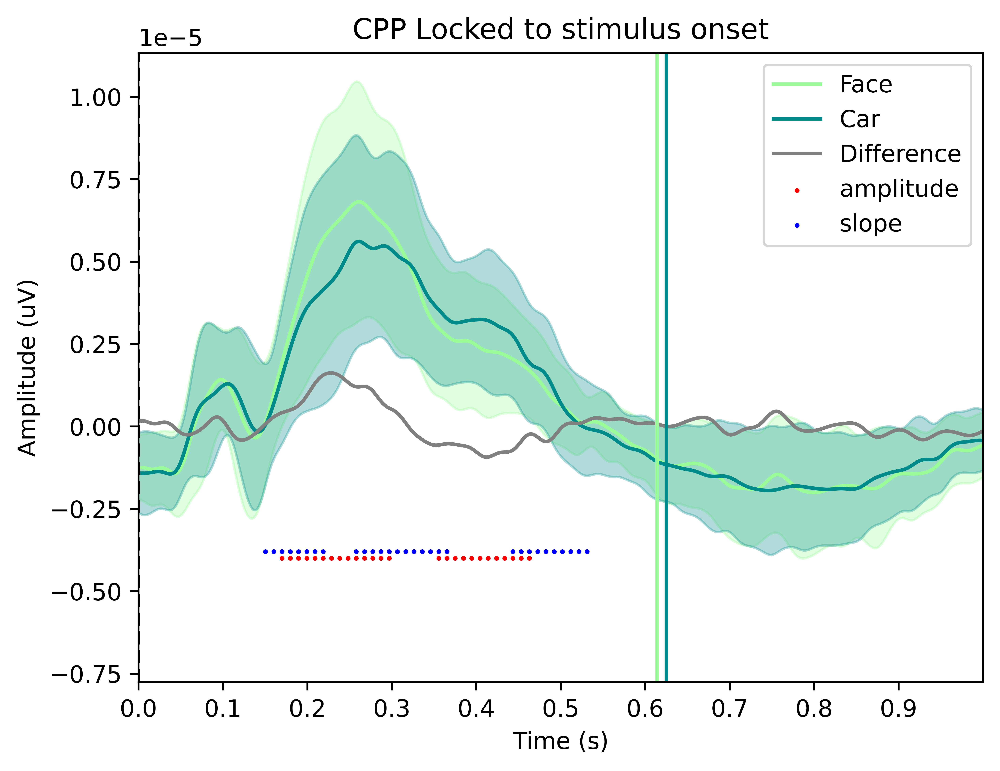

In [147]:
# transform points to time 
x =np.arange(dfs_n170_stim.loc[:,0:].shape[1])/512-1.5 # numbers of time points of epoch, sample rate is 512
# get the data of each condition
cond1 = dfs_n170_stim.loc[dfs_n170_stim['stim']=='face'].groupby('subj_idx').mean().reset_index().loc[:,0:1536]
cond2 = dfs_n170_stim.loc[dfs_n170_stim['stim']=='car'].groupby('subj_idx').mean().reset_index().loc[:,0:1536]
# get the mean and std of each condition
mean1 = cond1.mean(axis=0)
mean2 = cond2.mean(axis=0)
std1 = cond1.std(axis=0)
std2 = cond2.std(axis=0)
# plot the data
plt.subplots(#figsize=(10,5),
             dpi=1000)
# plot the mean of each condition
plt.plot(x,
         mean1,
         color='PaleGreen',
         label='Face')
plt.plot(x,
         mean2,
         color='DarkCyan',
         label='Car')
plt.plot(x, 
         mean1-mean2, 
         label='Difference',
         color='grey')
# plot the std of each condition
plt.fill_between(x, 
                 mean1 -std1,  
                 mean1 +std1,
                 alpha=0.3,
                 color = 'PaleGreen')
plt.fill_between(x, 
                 mean2 -std2,  
                 mean2 +std2,
                 alpha=0.3,
                 color='DarkCyan')
# plot horizontal and vertical lines to indicate the time point of response
rt_hc = dfs_stim.loc[dfs_stim['stim']=='face'].groupby('subj_idx').mean().reset_index().loc[:,'rt']+0.2
rt_lc = dfs_stim.loc[dfs_stim['stim']=='car'].groupby('subj_idx').mean().reset_index().loc[:,'rt']+0.2
plt.axvline(x=0, color='black', linestyle='--')
plt.axvline(x=rt_hc.mean(), color='PaleGreen', linestyle='-')
plt.axvline(x=rt_lc.mean(), color='DarkCyan', linestyle='-')

# transform time window to time points
ts_amp = np.array(sigtest(cond1,cond2,'amplitude'))
ts_slp = np.array(sigtest(cond1,cond2,'slope'))
#ts_pk = np.array(sigtest(cond1,cond2,'peak'))
# the location of the y axis
y_amp = np.array(ts_amp) * 0 - 4e-6
y_slp = np.array(ts_slp) * 0 - 3.8e-6
#y_pk = np.array(ts_pk) * 0 - 1.6e-6
# plot the time points of significant difference
plt.scatter(x=ts_amp/512-1.5,
            y=y_amp,
            color='red', 
            s=1, 
            label='amplitude')
plt.scatter(x=ts_slp/512-1.5,
            y=y_slp,
            color='blue', 
            s=1, 
            label='slope')
#plt.scatter(x=ts_pk/512-3,
#            y=y_pk,
#            color='gray', 
#            s=1, 
#            label='peak')
# set title and labels
plt.title('CPP Locked to stimulus onset')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (uV)')
plt.legend()
plt.xticks(np.arange(-3, 1, 0.1))
plt.xlim(0,1)
# save figure
#plt.savefig('figures/erp_cpp_resp_diff.png', dpi=1000)
plt.show()

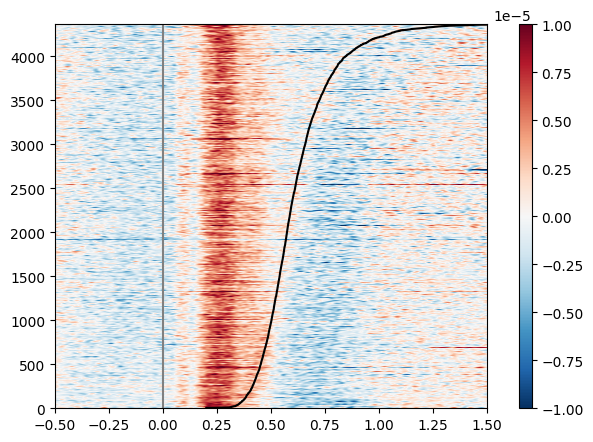

In [148]:
df_rm = dfs_n170_stim.sort_values(by=['rt'],ascending=True)
plt.imshow(df_rm.loc[:,0:],
           origin='lower',
           cmap='RdBu_r',
           vmin=-1e-5,
           vmax=1e-5,
           aspect='auto',
           extent=[-1.5,1.5,0,len(df_rm)])
plt.plot(df_rm['rt']+0.2,range(len(df_rm)),color = 'black')
plt.axvline(x=0, color='grey', linestyle='-')
plt.xlim(-0.5,1.5)
# set title and labels
plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
cax = plt.axes([0.85, 0.1, 0.02, 0.8])
plt.colorbar(cax=cax)

plt.show()

# Correlation rt and cpp

In [101]:
def find_onset(tst):
    ''' 
    Find the onset of the CPP
    tst: the time series of the CPP
    ot: the onset of the CPP    
    '''
    # the onset of the stim
    stp = round(1536 - (tst['rt'])*512)
    #print(stp)
    i = stp
    for i in range(stp,1536):

        if stats.ttest_1samp(tst[i:i+15].to_numpy(dtype='float32'),0,alternative='greater')[1] < 0.05:
            break
            
    ot = tst['rt']+((i/512)-3)
    return ot

In [29]:
# smooth the data
if os.path.exists('results/x2.csv'):
    x = dfs_resp
    x2 = pd.read_csv('results/x2.csv')
    x2.rename(columns={col: int(col) for col in x2.columns if col.isdigit()}, inplace=True)
else:
    x = dfs_resp
    x2 = x.copy()
    # smooth the data
    for i in range(2049):
        if (round(i-0.1*512) < 0):
            x2.loc[:,i] = x.loc[:,0:round(i+0.1*512)].mean(axis=1)
        elif (round(i+0.1*512) > 2048):
            x2.loc[:,i] = x.loc[:,round(i-0.1*512):2048].mean(axis=1)
        
        else:
            x2.loc[:,i] = x.loc[:,round(i-0.1*512):round(i+0.1*512)].mean(axis=1)
    # calculate the peak amplitude, slope and peak
    x2['am'] = x.loc[:,round((-0.1+3)*512):round((0.1+3)*512)].mean(axis=1)
    x2['slp'] = x2.loc[:, round((-0.18+3)*512):round((-0.1+3)*512)].apply(lambda x: np.polyfit(range(np.shape(x)[0]), x, 1)[0],axis=1)
    x2['pkl'] = x2.rt + ((x2.loc[:,round((-0.1+3)*512):round((0.1+3)*512)].apply(lambda x: np.argmax(x),axis=1)+round((-0.1+3)*512))/512-3)
    # calculate the quantile of each subject
    x2.insert(loc=2, column='slp_quantile', value=x2.groupby(['subj_idx','coherence']).slp.apply(lambda x: pd.qcut(x, q=4, labels=['1st','2nd','3rd','4th'])))
    x2.insert(loc=2, column='am_quantile', value=x2.groupby(['subj_idx','coherence']).am.apply(lambda x: pd.qcut(x, q=4, labels=['1st','2nd','3rd','4th'])))
    x2.insert(loc=2, column='pkl_quantile', value=x2.groupby(['subj_idx','coherence']).pkl.apply(lambda x: pd.qcut(x, q=4, labels=['1st','2nd','3rd','4th'])))
    x2.to_csv('results/x2.csv',index=False)

In [102]:
x = dfs_resp
x2 = x.copy()
# smooth the data
for i in range(2049):
    if (round(i-0.1*512) < 0):
        x2.loc[:,i] = x.loc[:,0:round(i+0.1*512)].mean(axis=1)
    elif (round(i+0.1*512) > 2048):
        x2.loc[:,i] = x.loc[:,round(i-0.1*512):2048].mean(axis=1)
    
    else:
        x2.loc[:,i] = x.loc[:,round(i-0.1*512):round(i+0.1*512)].mean(axis=1)
# calculate the peak amplitude, slope and peak
x2['am'] = x.loc[:,round((-0.1+3)*512):round((0.1+3)*512)].mean(axis=1)
x2['slp'] = x2.loc[:, round((-0.18+3)*512):round((-0.1+3)*512)].apply(lambda x: np.polyfit(range(np.shape(x)[0]), x, 1)[0],axis=1)
x2['pkl'] = x2.rt + ((x2.loc[:,round((-0.1+3)*512):round((0.1+3)*512)].apply(lambda x: np.argmax(x),axis=1)+round((-0.1+3)*512))/512-3)
x2['onset'] = x2.apply(find_onset,axis=1)
x2['dt'] = x2['pkl']-x2['onset']
# calculate the quantile of each subject
x2.insert(loc=2, column='slp_quantile', value=x2.groupby(['subj_idx','coherence']).slp.apply(lambda x: pd.qcut(x, q=4, labels=['1st','2nd','3rd','4th'])))
x2.insert(loc=2, column='am_quantile', value=x2.groupby(['subj_idx','coherence']).am.apply(lambda x: pd.qcut(x, q=4, labels=['1st','2nd','3rd','4th'])))
x2.insert(loc=2, column='pkl_quantile', value=x2.groupby(['subj_idx','coherence']).pkl.apply(lambda x: pd.qcut(x, q=4, labels=['1st','2nd','3rd','4th'])))
x2.insert(loc=2, column='onset_quantile', value=x2.groupby(['subj_idx','coherence']).onset.apply(lambda x: pd.qcut(x, q=4, labels=['1st','2nd','3rd','4th'])))
x2.insert(loc=2, column='dt_quantile', value=x2.groupby(['subj_idx','coherence']).dt.apply(lambda x: pd.qcut(x, q=4, labels=['1st','2nd','3rd','4th'])))
x2.to_csv('results/x2.csv',index=False)

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9924\2223682041.py:19: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9924\2223682041.py:20: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9924\222368204

In [68]:
def plot_single_trial_eeg(x, x2):
    '''
    x: the original data
    x2: the smoothed data
    '''
    # Define the input field
    row = widgets.IntSlider(min=0, max=x.shape[0], value=0, description='Row:')
    text1 = widgets.Text(value='', description='Sub:')
    text2 = widgets.Text(value='', description='Coh:')
    text3 = widgets.Text(value='', description='Pri:')
    text5 = widgets.Text(value='', description='RT:')
    container = widgets.HBox(children=[row])
    container2 = widgets.HBox(children=[text1, text2, text3, text5])

    # Create the traces and figure widget
    trace1 = go.Scatter(x=np.arange(2049)/512-3, y=x.loc[:,0:].iloc[0,:], mode='lines', name='Before')
    trace2 = go.Scatter(x=np.arange(2049)/512-3, y=x2.loc[:,0:].iloc[0,:], mode='lines', name='After')
    g = go.FigureWidget(data=[trace1, trace2],
                        layout=go.Layout(
                            title=dict(text='Single trial eeg'),
                            shapes=[dict(type='line', 
                                        xref='x', 
                                        yref='paper', 
                                        x0=-x2.loc[:,'rt'][0], 
                                        y0=0, x1=-x2.loc[:,'rt'][0], 
                                        y1=1,
                                        line=dict(color='black', width=1))],
                        ))

    # Define the update function
    def update(change):
        with g.batch_update():
            # Update the traces and axis labels
            g.data[0].y = x.loc[:,0:].iloc[row.value,:]
            g.data[1].y = x2.loc[:,0:].iloc[row.value,:]
            g.layout.xaxis.title = 'Time'
            g.layout.yaxis.title = 'Amplitude/V'

            # Update the vertical line position
            g.layout.shapes[0].x0 = -x2.loc[:,'rt'][row.value]
            g.layout.shapes[0].x1 = -x2.loc[:,'rt'][row.value]

            # Update the text widget
            text1.value = f"Sub: {x2.loc[:,'subj_idx'][row.value]}"
            text2.value = f"Coh: {x2.loc[:,'coherence'][row.value]}"
            text3.value = f"Pri: {x2.loc[:,'prioritized'][row.value]}"
            text5.value = f"RT: {x2.loc[:,'rt'][row.value]}"

    # Set up the slider to trigger the update function when its value changes
    row.observe(update, names="value")

    # Display the input field, plot, and text widget
    display(widgets.VBox([container, container2, g]))

In [69]:
plot_single_trial_eeg(x, x2)

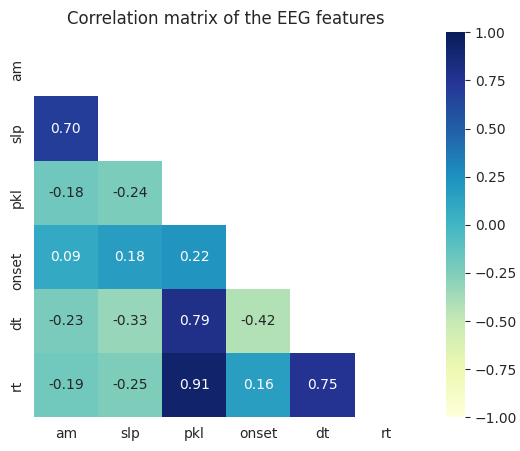

In [127]:
# plot correlatin matrix of 
stats.pearsonr(x3['am'],x3['rt'])
stats.pearsonr(x3['slp'],x3['rt'])
stats.pearsonr(x3['pkl'],x3['rt'])
stats.pearsonr(x3['onset'],x3['rt'])
stats.pearsonr(x3['dt'],x3['rt'])

# plot the correlation matrix
corr = x3[['am','slp','pkl','onset','dt','rt']].corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(7, 5))
    ax = sns.heatmap(corr, mask=mask, vmax=1,vmin=-1, square=True, annot=True, fmt='.2f', cmap='YlGnBu')
    plt.title('Correlation matrix of the EEG features')



In [99]:
print(stats.pearsonr(x3['am'],x3['rt']))
print(stats.pearsonr(x3['slp'],x3['rt']))
print(stats.pearsonr(x3['pkl'],x3['rt']))
print(stats.pearsonr(x3['onset'],x3['rt']))
print(stats.pearsonr(x3['dt'],x3['rt']))
scr_sc = x3.groupby(['subj_idx', 'coherence'])['am','rt','slp','pkl','onset','dt'].mean().reset_index()
print(stats.pearsonr(scr_sc['am'],scr_sc['rt']))
print(stats.pearsonr(scr_sc['slp'],scr_sc['rt']))
print(stats.pearsonr(scr_sc['pkl'],scr_sc['rt']))
print(stats.pearsonr(scr_sc['onset'],scr_sc['rt']))
print(stats.pearsonr(scr_sc['dt'],scr_sc['rt']))
print(stats.ttest_rel(scr_sc[scr_sc['coherence']=='low']['am'],scr_sc[scr_sc['coherence']=='high']['am']))
print(stats.ttest_rel(scr_sc[scr_sc['coherence']=='low']['slp'],scr_sc[scr_sc['coherence']=='high']['slp']))
print(stats.ttest_rel(scr_sc[scr_sc['coherence']=='low']['pkl'],scr_sc[scr_sc['coherence']=='high']['pkl']))
print(stats.ttest_rel(scr_sc[scr_sc['coherence']=='low']['onset'],scr_sc[scr_sc['coherence']=='high']['onset']))
print(stats.ttest_rel(scr_sc[scr_sc['coherence']=='low']['dt'],scr_sc[scr_sc['coherence']=='high']['dt']))


PearsonRResult(statistic=-0.18547148613263395, pvalue=4.545544176837794e-25)
PearsonRResult(statistic=-0.25893855444073677, pvalue=4.879234805331999e-48)
PearsonRResult(statistic=0.9462769812778434, pvalue=0.0)
PearsonRResult(statistic=0.38957698384943107, pvalue=2.170658864530577e-111)
PearsonRResult(statistic=0.854897218624702, pvalue=0.0)
PearsonRResult(statistic=-0.46291585748213687, pvalue=0.00763170407808321)
PearsonRResult(statistic=-0.6542950002045175, pvalue=4.865620452481187e-05)
PearsonRResult(statistic=0.9799835922179763, pvalue=1.3762576487968239e-22)
PearsonRResult(statistic=0.6985594213013786, pvalue=8.739967706905558e-06)
PearsonRResult(statistic=0.9729738341150398, pvalue=1.1870935633871666e-20)
TtestResult(statistic=-1.2183967326564684, pvalue=0.24189037687959652, df=15)
TtestResult(statistic=-3.382407018110408, pvalue=0.004103261494509982, df=15)
TtestResult(statistic=7.561571521350657, pvalue=1.7117412759964218e-06, df=15)
TtestResult(statistic=4.412152476983975, pv

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9924\596172352.py:6: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



PearsonRResult(statistic=-0.19182199524934235, pvalue=3.813584969254612e-37)
PearsonRResult(statistic=-0.24840845044635, pvalue=7.170658722160895e-62)
PearsonRResult(statistic=0.9147465369601905, pvalue=0.0)
PearsonRResult(statistic=0.3394229415280182, pvalue=3.714686042727402e-117)
PearsonRResult(statistic=0.841523820022811, pvalue=0.0)


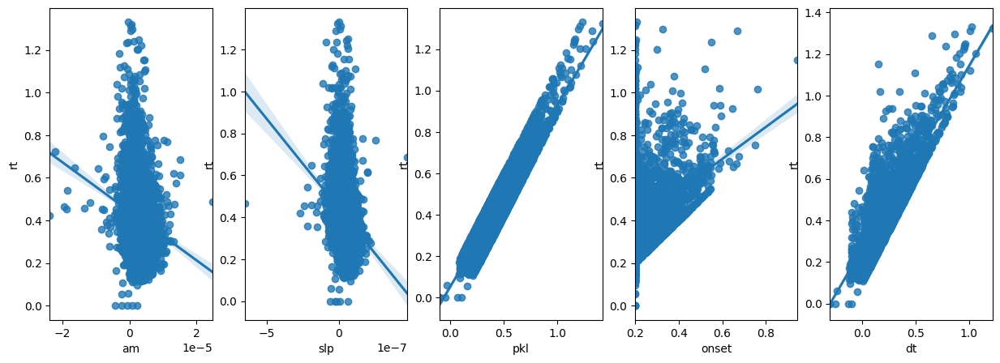

In [74]:
# plot the scatter plot of amplitude, slope and peak against reaction time for each trial
plt.figure(figsize=(15,5))
plt.subplot(151)
sns.regplot(x = 'am', y = 'rt', data = x2)
plt.subplot(152)
sns.regplot(x = 'slp', y = 'rt', data = x2)
plt.subplot(153)
sns.regplot(x = 'pkl', y = 'rt', data = x2)
plt.subplot(154)
sns.regplot(x = 'onset', y = 'rt', data = x2)
plt.subplot(155)
sns.regplot(x = 'dt', y = 'rt', data = x2)
print(stats.pearsonr(x2['am'],x2['rt']))
print(stats.pearsonr(x2['slp'],x2['rt']))
print(stats.pearsonr(x2['pkl'],x2['rt']))
print(stats.pearsonr(x2['onset'],x2['rt']))
print(stats.pearsonr(x2['dt'],x2['rt']))

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9924\3533475136.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  scr_sc = x2.groupby(['subj_idx', 'coherence'])['am','rt','slp','pkl','onset','dt'].mean().reset_index()


PearsonRResult(statistic=-0.502906114999758, pvalue=0.003350105188418725)
PearsonRResult(statistic=-0.6720956381823209, pvalue=2.5248593477380412e-05)
PearsonRResult(statistic=0.9630328364483955, pvalue=1.219605364430241e-18)
PearsonRResult(statistic=0.6378606368016007, pvalue=8.596201586870044e-05)
PearsonRResult(statistic=0.9636018087212241, pvalue=9.701142803665443e-19)
TtestResult(statistic=-2.3638763331838457, pvalue=0.032002474931104384, df=15)
TtestResult(statistic=-3.8851528923331737, pvalue=0.001464935668662494, df=15)
TtestResult(statistic=7.130980481697779, pvalue=3.4434802638315206e-06, df=15)
TtestResult(statistic=4.527477466549401, pvalue=0.00040075462986636536, df=15)
TtestResult(statistic=5.633509609891407, pvalue=4.75956483405846e-05, df=15)


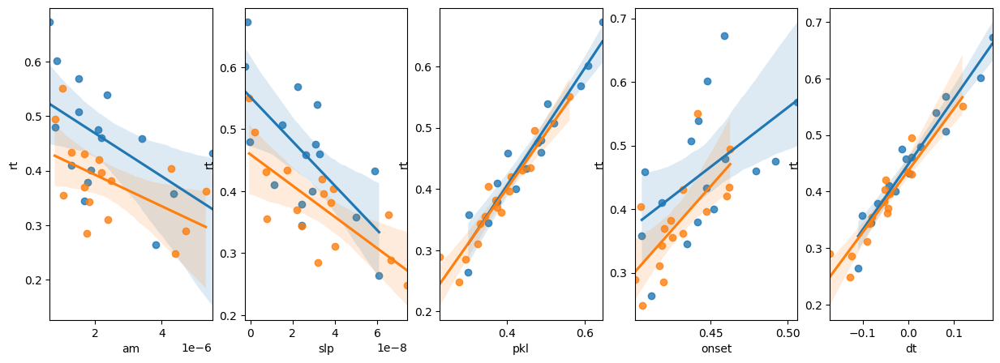

In [39]:
# plot the scatter plot of amplitude, slope and peak against reaction time for each subject and coherence
scr_sc = x2.groupby(['subj_idx', 'coherence'])['am','rt','slp','pkl','onset','dt'].mean().reset_index()
print(stats.pearsonr(scr_sc['am'],scr_sc['rt']))
print(stats.pearsonr(scr_sc['slp'],scr_sc['rt']))
print(stats.pearsonr(scr_sc['pkl'],scr_sc['rt']))
print(stats.pearsonr(scr_sc['onset'],scr_sc['rt']))
print(stats.pearsonr(scr_sc['dt'],scr_sc['rt']))
print(stats.ttest_rel(scr_sc[scr_sc['coherence']=='low']['am'],scr_sc[scr_sc['coherence']=='high']['am']))
print(stats.ttest_rel(scr_sc[scr_sc['coherence']=='low']['slp'],scr_sc[scr_sc['coherence']=='high']['slp']))
print(stats.ttest_rel(scr_sc[scr_sc['coherence']=='low']['pkl'],scr_sc[scr_sc['coherence']=='high']['pkl']))
print(stats.ttest_rel(scr_sc[scr_sc['coherence']=='low']['onset'],scr_sc[scr_sc['coherence']=='high']['onset']))
print(stats.ttest_rel(scr_sc[scr_sc['coherence']=='low']['dt'],scr_sc[scr_sc['coherence']=='high']['dt']))

fig, axs = plt.subplots(ncols=5, figsize=(15, 5))

sns.regplot(x = 'am', y = 'rt', data = scr_sc[scr_sc['coherence']=='low'], ax=axs[0])
sns.regplot(x = 'am', y = 'rt', data = scr_sc[scr_sc['coherence']=='high'], ax=axs[0])
sns.regplot(x = 'slp', y = 'rt', data = scr_sc[scr_sc['coherence']=='low'], ax=axs[1])
sns.regplot(x = 'slp', y = 'rt', data = scr_sc[scr_sc['coherence']=='high'], ax=axs[1])
sns.regplot(x = 'pkl', y = 'rt', data = scr_sc[scr_sc['coherence']=='low'], ax=axs[2])
sns.regplot(x = 'pkl', y = 'rt', data = scr_sc[scr_sc['coherence']=='high'], ax=axs[2])
sns.regplot(x = 'onset', y = 'rt', data = scr_sc[scr_sc['coherence']=='low'], ax=axs[3])
sns.regplot(x = 'onset', y = 'rt', data = scr_sc[scr_sc['coherence']=='high'], ax=axs[3])
sns.regplot(x = 'dt', y = 'rt', data = scr_sc[scr_sc['coherence']=='low'], ax=axs[4])
sns.regplot(x = 'dt', y = 'rt', data = scr_sc[scr_sc['coherence']=='high'], ax=axs[4])

plt.show()

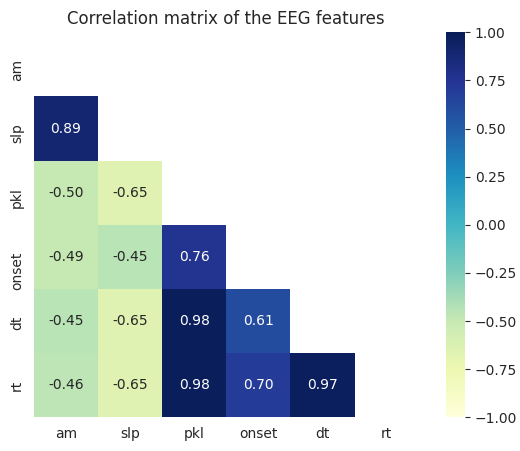

In [128]:
corr = scr_sc[['am','slp','pkl','onset','dt','rt']].corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(7, 5))
    ax = sns.heatmap(corr, mask=mask, vmax=1,vmin=-1, square=True, annot=True, fmt='.2f', cmap='YlGnBu')
    plt.title('Correlation matrix of the EEG features')


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9924\2045875189.py:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  scr_s = x2.groupby(['subj_idx'])['am','rt','slp','pkl','onset','dt'].mean().reset_index()


PearsonRResult(statistic=-0.5491759350609371, pvalue=0.02757333953441787)
PearsonRResult(statistic=-0.7199044215695047, pvalue=0.0016631023186454332)
PearsonRResult(statistic=0.9549472716186674, pvalue=8.965053930923133e-09)
PearsonRResult(statistic=0.6253733068829965, pvalue=0.009576887119502473)
PearsonRResult(statistic=0.95848666298589, pvalue=5.1041702407740016e-09)


<Axes: xlabel='dt', ylabel='rt'>

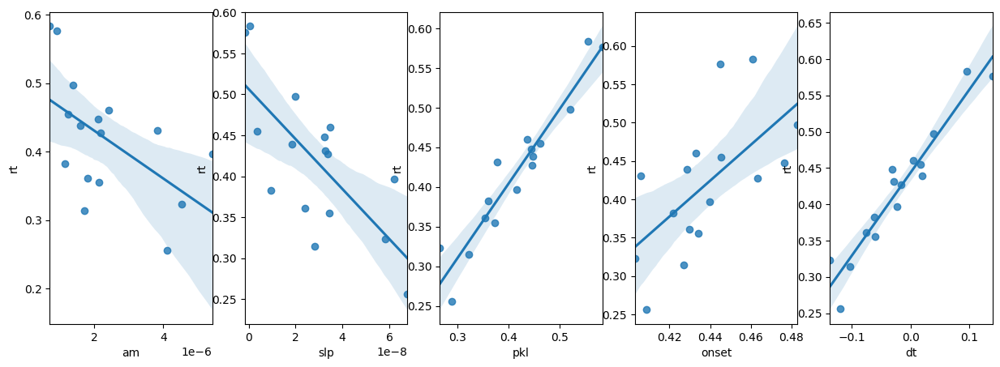

In [41]:
# plot the scatter plot of amplitude, slope and peak against reaction time for each subject
scr_s = x2.groupby(['subj_idx'])['am','rt','slp','pkl','onset','dt'].mean().reset_index()
print(stats.pearsonr(scr_s['am'],scr_s['rt']))
print(stats.pearsonr(scr_s['slp'],scr_s['rt']))
print(stats.pearsonr(scr_s['pkl'],scr_s['rt']))
print(stats.pearsonr(scr_s['onset'],scr_s['rt']))
print(stats.pearsonr(scr_s['dt'],scr_s['rt']))
plt.figure(figsize=(15,5))
plt.subplot(151)
sns.regplot(x = 'am', y = 'rt', data = scr_s)
plt.subplot(152)
sns.regplot(x = 'slp', y = 'rt', data = scr_s)
plt.subplot(153)
sns.regplot(x = 'pkl', y = 'rt', data = scr_s)
plt.subplot(154)
sns.regplot(x = 'onset', y = 'rt', data = scr_s)
plt.subplot(155)
sns.regplot(x = 'dt', y = 'rt', data = scr_s)

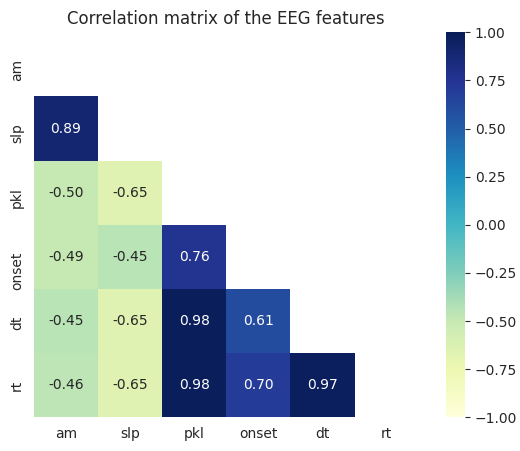

In [129]:
corr = scr_sc[['am','slp','pkl','onset','dt','rt']].corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(7, 5))
    ax = sns.heatmap(corr, mask=mask, vmax=1,vmin=-1, square=True, annot=True, fmt='.2f', cmap='YlGnBu')
    plt.title('Correlation matrix of the EEG features')


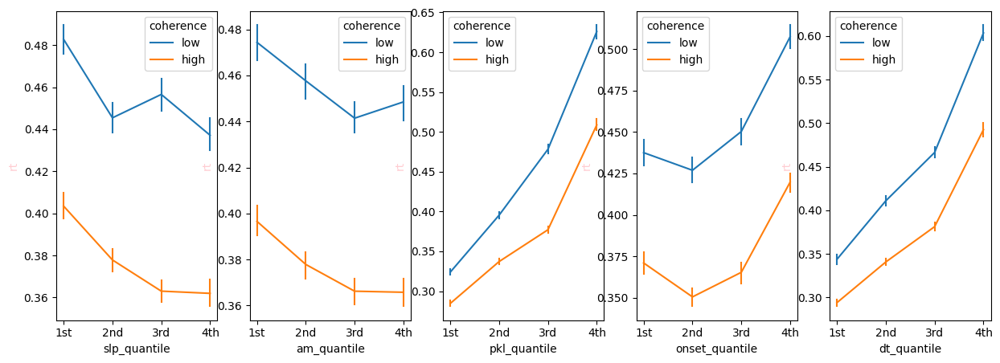

In [42]:
fig, axs = plt.subplots(ncols=5, figsize=(15, 5))


sns.lineplot(x='slp_quantile', y='rt', hue='coherence', err_style='bars', data=x2.sort_values(by=['slp_quantile']), ci=68, color='#FFCDD2', ax=axs[0])
axs[0].set_xlabel('slp_quantile')
axs[0].set_ylabel('rt', color='#FFCDD2')
axs[0].tick_params(axis='y')

sns.lineplot(x='am_quantile', y='rt', hue='coherence', err_style='bars', data=x2.sort_values(by=['slp_quantile']), ci=68, color='#FFCDD2', ax=axs[1])
axs[1].set_xlabel('am_quantile')
axs[1].set_ylabel('rt', color='#FFCDD2')
axs[1].tick_params(axis='y')

sns.lineplot(x='pkl_quantile', y='rt', hue='coherence', err_style='bars', data=x2.sort_values(by=['slp_quantile']), ci=68, color='#FFCDD2', ax=axs[2])
axs[2].set_xlabel('pkl_quantile')
axs[2].set_ylabel('rt', color='#FFCDD2')
axs[2].tick_params(axis='y')

sns.lineplot(x='onset_quantile', y='rt', hue='coherence', err_style='bars', data=x2.sort_values(by=['slp_quantile']), ci=68, color='#FFCDD2', ax=axs[3])
axs[3].set_xlabel('onset_quantile')
axs[3].set_ylabel('rt', color='#FFCDD2')
axs[3].tick_params(axis='y')

sns.lineplot(x='dt_quantile', y='rt', hue='coherence', err_style='bars', data=x2.sort_values(by=['slp_quantile']), ci=68, color='#FFCDD2', ax=axs[4])
axs[4].set_xlabel('dt_quantile')
axs[4].set_ylabel('rt', color='#FFCDD2')
axs[4].tick_params(axis='y')



plt.show()


# turn the data to run ddm

In [5]:
if os.path.exists('results/dfs2ddm.csv'):
    dfs2ddm = pd.read_csv('results/dfs2ddm.csv')
else:
    dfs2ddm = x2.loc[:,['subj_idx','coherence','slp','am','pkl','rt','slp_quantile','am_quantile','pkl_quantile', 'prioritized','correct','onset','dt','onset_quantile','dt_quantile']]
    dfs2ddm['am'] = dfs2ddm.groupby(['subj_idx','coherence']).am.apply(lambda x: (x - x.mean()) / x.std())
    dfs2ddm['slp'] = dfs2ddm.groupby(['subj_idx','coherence']).slp.apply(lambda x: (x - x.mean()) / x.std())
    dfs2ddm.to_csv('results/dfs2ddm.csv',index=False)

In [142]:
dfs2ddm = x2.loc[:,['subj_idx','coherence','slp','am','pkl','rt','slp_quantile','am_quantile','pkl_quantile', 'prioritized','correct','onset','dt','onset_quantile','dt_quantile']]
dfs2ddm['am'] = dfs2ddm.groupby(['subj_idx','coherence']).am.apply(lambda x: (x - x.mean()) / x.std())
dfs2ddm['slp'] = dfs2ddm.groupby(['subj_idx','coherence']).slp.apply(lambda x: (x - x.mean()) / x.std())
dfs2ddm.to_csv('results/dfs2ddm.csv',index=False)

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9924\280479682.py:2: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9924\280479682.py:3: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



In [3]:
m5trc = pd.read_csv('m5_traces.csv')
m5slp = pd.read_csv('m5_slp_traces.csv')
m5bin = pd.read_csv('m5_bins_traces.csv')
m5dt = pd.read_csv('m5_dt.csv')

## m5trc

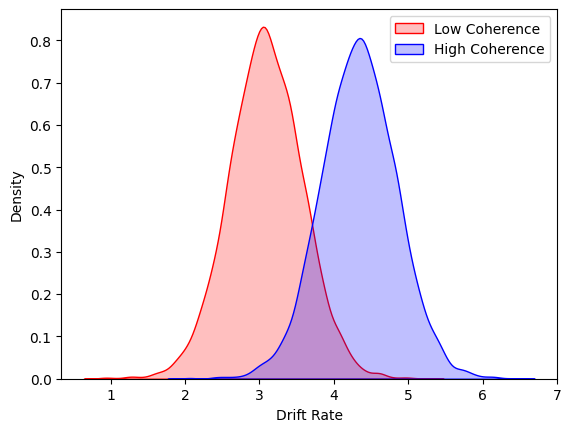

In [44]:
vint = m5trc.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,0]
vslp = m5trc.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,1]
sns.kdeplot(vint, shade=True, color="r",label='Low Coherence')
sns.kdeplot(vslp+vint, shade=True, color="b",label='High Coherence')
plt.xlabel('Drift Rate')
plt.legend()

In [139]:
vlow_sub = m5trc.filter(regex='^v_In.*sub.*$').mean(axis=0).to_numpy()
vhigh_sub = m5trc.filter(regex='^v_In.*sub.*$').mean(axis=0).to_numpy() + m5trc.filter(regex='^v_C.*sub.*$').mean(axis=0).to_numpy()
slp_v = x2.groupby(['subj_idx','coherence'])['slp','pkl','am','rt','onset','dt'].mean().reset_index()
slp_v.loc[(slp_v['coherence'] == 'low'),'v'] = vlow_sub
slp_v.loc[(slp_v['coherence'] == 'high'),'v'] = vhigh_sub

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9924\4252311811.py:3: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



PearsonRResult(statistic=0.3631322328435795, pvalue=0.041073759220401455)
PearsonRResult(statistic=-0.5456529376546833, pvalue=0.0012375730909525448)
PearsonRResult(statistic=-0.5106550947584513, pvalue=0.00282322010690944)
PearsonRResult(statistic=0.23979924889470797, pvalue=0.18619345269472357)
PearsonRResult(statistic=-0.02502844792523586, pvalue=0.8918446952258923)
PearsonRResult(statistic=-0.5456903948053818, pvalue=0.0012364216652031078)


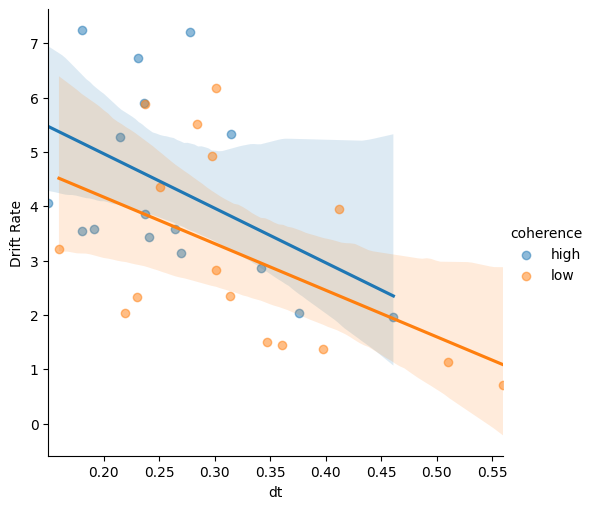

In [140]:
print(stats.pearsonr(slp_v['slp'],slp_v['v']))
print(stats.pearsonr(slp_v['pkl'],slp_v['v']))
print(stats.pearsonr(slp_v['rt'],slp_v['v']))
print(stats.pearsonr(slp_v['am'],slp_v['v']))
print(stats.pearsonr(slp_v['onset'],slp_v['v']))
print(stats.pearsonr(slp_v['dt'],slp_v['v']))
sns.lmplot(x='dt', y='v', data=slp_v, hue = 'coherence', scatter_kws={'alpha':0.5})
plt.ylabel('Drift Rate')
plt.show()

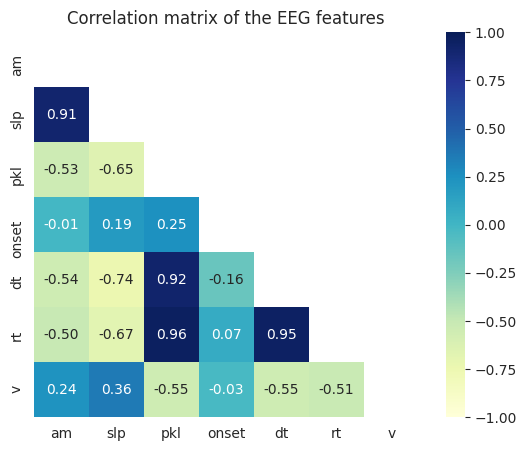

In [141]:
corr = slp_v[['am','slp','pkl','onset','dt','rt','v']].corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(7, 5))
    ax = sns.heatmap(corr, mask=mask, vmax=1,vmin=-1, square=True, annot=True, fmt='.2f', cmap='YlGnBu')
    plt.title('Correlation matrix of the EEG features')


In [143]:
t0no = m5trc.filter(regex='^t_I(?!.*(std)).*sub.*$').mean(axis=0).to_numpy()
t0yes = m5trc.filter(regex='^t_I(?!.*(std)).*sub.*$').mean(axis=0).to_numpy()+m5trc.filter(regex='^t_C(?!.*(std)).*sub.*$').mean(axis=0).to_numpy()
slp_t = x2.groupby(['subj_idx','prioritized'])['slp','pkl','am','rt','onset','dt'].mean().reset_index()
slp_t.loc[(slp_t['prioritized'] == 'no'),'t'] = t0no
slp_t.loc[(slp_t['prioritized'] == 'yes'),'t'] = t0yes

C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9924\3887039531.py:3: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



PearsonRResult(statistic=-0.5439969105537003, pvalue=0.0012894265537104518)
PearsonRResult(statistic=0.6524868808060892, pvalue=5.188602903012705e-05)
PearsonRResult(statistic=0.6977197225159157, pvalue=9.05469631472883e-06)
PearsonRResult(statistic=-0.3565160093903117, pvalue=0.045190126300114083)
PearsonRResult(statistic=-0.013534524635638007, pvalue=0.9413923791359557)
PearsonRResult(statistic=0.6488119980625999, pvalue=5.9050240854183994e-05)


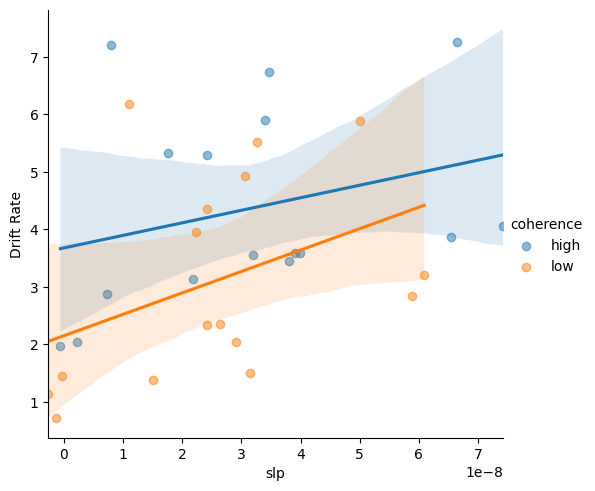

In [144]:
print(stats.pearsonr(slp_t['slp'],slp_t['t']))
print(stats.pearsonr(slp_t['pkl'],slp_t['t']))
print(stats.pearsonr(slp_t['rt'],slp_t['t']))
print(stats.pearsonr(slp_t['am'],slp_t['t']))
print(stats.pearsonr(slp_t['onset'],slp_t['t']))
print(stats.pearsonr(slp_t['dt'],slp_t['t']))
sns.lmplot(x='slp', y='v', data=slp_v, hue = 'coherence', scatter_kws={'alpha':0.5})
plt.ylabel('Drift Rate')
plt.show()

PearsonRResult(statistic=0.0345361614543256, pvalue=0.8989598334762222)
PearsonRResult(statistic=-0.1023851270666371, pvalue=0.7059406194454196)
PearsonRResult(statistic=-0.04946810212971893, pvalue=0.8556363978822081)
PearsonRResult(statistic=-0.03241849757708552, pvalue=0.905128473639641)
PearsonRResult(statistic=0.26840026834989295, pvalue=0.3148421491545616)
PearsonRResult(statistic=-0.21267389322311836, pvalue=0.429061029840602)


C:\Users\liuyikang\AppData\Local\Temp\ipykernel_9140\2082593135.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



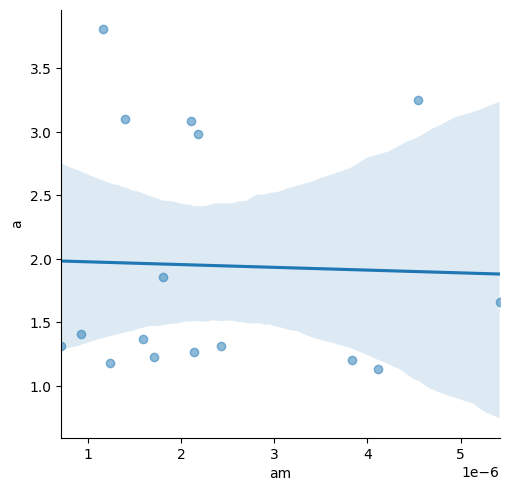

In [372]:
a = m5trc.filter(regex='^a(?!.*(std)).*sub.*$').mean(axis=0).to_numpy()
slp_a = x2.groupby(['subj_idx'])['slp','pkl','am','rt','onset','dt'].mean().reset_index()
slp_a['a'] = a
print(stats.pearsonr(slp_a['slp'],a))
print(stats.pearsonr(slp_a['pkl'],a))
print(stats.pearsonr(slp_a['rt'],a))
print(stats.pearsonr(slp_a['am'],a))
print(stats.pearsonr(slp_a['onset'],a))
print(stats.pearsonr(slp_a['dt'],a))
sns.lmplot(x='am', y='a', data=slp_a, scatter_kws={'alpha':0.5})

## m5bin

In [249]:
m5bin.filter(regex='^v(?!.*(sub|std)).*$')

,v_Intercept,"v_C(coherence, Treatment('low'))[T.high]","v_C(slp_quantile, Treatment('1st'))[T.2nd]","v_C(slp_quantile, Treatment('1st'))[T.3rd]","v_C(slp_quantile, Treatment('1st'))[T.4th]","v_C(coherence, Treatment('low'))[T.high]:C(slp_quantile, Treatment('1st'))[T.2nd]","v_C(coherence, Treatment('low'))[T.high]:C(slp_quantile, Treatment('1st'))[T.3rd]","v_C(coherence, Treatment('low'))[T.high]:C(slp_quantile, Treatment('1st'))[T.4th]"
0,2.164851,1.555942,0.492860,0.673079,0.940395,-0.268237,0.158459,-0.088772
1,3.054676,1.476490,0.599357,0.628670,0.803712,-0.281128,0.126179,-0.084450
2,2.563585,1.311845,0.649902,0.552159,0.709067,-0.276726,0.157478,-0.085880
3,2.639245,1.380598,0.649544,0.651856,0.738954,-0.266728,0.131839,-0.089990
4,2.560205,1.540475,0.562219,0.717338,1.072058,-0.255975,0.169936,-0.083792
...,...,...,...,...,...,...,...,...
7995,3.099059,1.308660,0.692661,0.475849,0.831302,-0.303389,0.035638,0.039893
7996,2.144020,1.566373,0.673214,0.475507,0.790696,-0.309876,0.076440,0.085895
7997,2.959956,1.447623,0.655646,0.474987,0.772687,-0.319338,-0.083728,0.082875
7998,2.990969,1.691954,0.580475,0.475084,0.833925,-0.301590,0.265289,0.113121


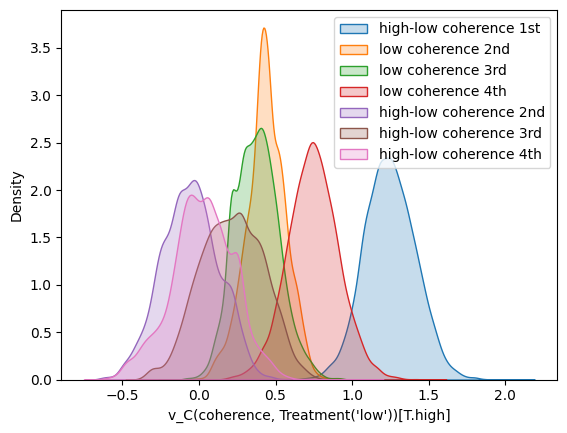

In [250]:
#sns.kdeplot(m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,0], shade=True,label='low coherence 1st')
sns.kdeplot(m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,1], shade=True,label='high-low coherence 1st')
sns.kdeplot(m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,2], shade=True,label='low coherence 2nd')
sns.kdeplot(m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,3], shade=True,label='low coherence 3rd')
sns.kdeplot(m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,4], shade=True,label='low coherence 4th')
sns.kdeplot(m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,5], shade=True,label='high-low coherence 2nd')
sns.kdeplot(m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,6], shade=True,label='high-low coherence 3rd')
sns.kdeplot(m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,7], shade=True,label='high-low coherence 4th')
plt.legend()

In [251]:
vlow1st = m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,0]
vlow2st = m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,0]+m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,2]
vlow3st = m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,0]+m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,3]
vlow4st = m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,0]+m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,4]
vhigh1st = m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,0]+m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,1]
vhigh2st = m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,0]+m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,1]+m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,2]+m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,5]
vhigh3st = m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,0]+m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,1]+m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,3]+m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,6]
vhigh4st = m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,0]+m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,1]+m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,4]+m5bin.filter(regex='^v(?!.*(sub|std)).*$').iloc[:,7]


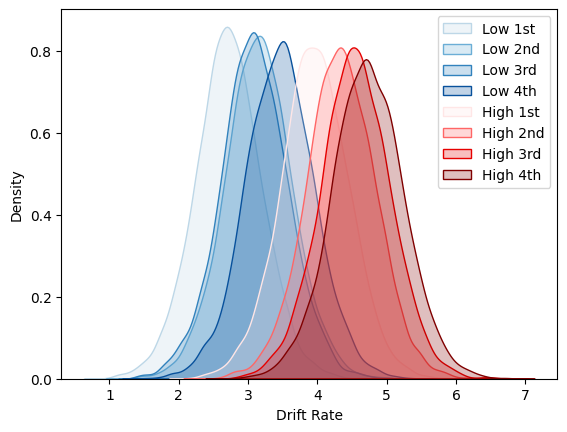

In [252]:
sns.kdeplot(vlow1st, shade=True, color="#bdd7e7",label='Low 1st')
sns.kdeplot(vlow2st, shade=True, color="#6baed6",label='Low 2nd')
sns.kdeplot(vlow3st, shade=True, color="#3182bd",label='Low 3rd')
sns.kdeplot(vlow4st, shade=True, color="#08519c",label='Low 4th')
sns.kdeplot(vhigh1st, shade=True, color="#ffe6e6",label='High 1st')
sns.kdeplot(vhigh2st, shade=True, color="#ff6666",label='High 2nd')
sns.kdeplot(vhigh3st, shade=True, color="#e60000",label='High 3rd')
sns.kdeplot(vhigh4st, shade=True, color="#800000",label='High 4th')
plt.xlabel('Drift Rate')
plt.legend()


In [253]:
vlow1st_sub = m5bin.filter(regex='^v_In(?!.*(std)).*sub.*$').mean(axis=0).to_numpy()
vlow2rd_sub = m5bin.filter(regex='^v_In(?!.*(std)).*sub.*$').mean(axis=0).to_numpy() + m5bin.filter(regex='^v_C(?!.*(:)).*2nd.*sub.*$').mean(axis=0).to_numpy()
vlow3rd_sub = m5bin.filter(regex='^v_In(?!.*(std)).*sub.*$').mean(axis=0).to_numpy() + m5bin.filter(regex='^v_C(?!.*(:)).*3rd.*sub.*$').mean(axis=0).to_numpy()
vlow4th_sub = m5bin.filter(regex='^v_In(?!.*(std)).*sub.*$').mean(axis=0).to_numpy() + m5bin.filter(regex='^v_C(?!.*(:)).*4th.*sub.*$').mean(axis=0).to_numpy()
vhigh1st_sub = m5bin.filter(regex='^v_In(?!.*(std)).*sub.*$').mean(axis=0).to_numpy() + m5bin.filter(regex='^v_C(?!.*(slp)).*sub.*$').mean(axis=0).to_numpy()
vhigh2rd_sub = m5bin.filter(regex='^v_In(?!.*(std)).*sub.*$').mean(axis=0).to_numpy() + m5bin.filter(regex='^v_C(?!.*(slp)).*sub.*$').mean(axis=0).to_numpy()+ m5bin.filter(regex='^v_C(?!.*(:)).*2nd.*sub.*$').mean(axis=0).to_numpy()+m5bin.filter(regex='^v_C.*co.*slp.*2nd.*sub.*$').mean(axis=0).to_numpy()
vhigh3rd_sub = m5bin.filter(regex='^v_In(?!.*(std)).*sub.*$').mean(axis=0).to_numpy() + m5bin.filter(regex='^v_C(?!.*(slp)).*sub.*$').mean(axis=0).to_numpy()+ m5bin.filter(regex='^v_C(?!.*(:)).*3rd.*sub.*$').mean(axis=0).to_numpy()+m5bin.filter(regex='^v_C.*co.*slp.*3rd.*sub.*$').mean(axis=0).to_numpy()
vhigh4th_sub = m5bin.filter(regex='^v_In(?!.*(std)).*sub.*$').mean(axis=0).to_numpy() + m5bin.filter(regex='^v_C(?!.*(slp)).*sub.*$').mean(axis=0).to_numpy()+ m5bin.filter(regex='^v_C(?!.*(:)).*4th.*sub.*$').mean(axis=0).to_numpy() +m5bin.filter(regex='^v_C.*co.*slp.*4th.*sub.*$').mean(axis=0).to_numpy()

In [254]:
dfs2ddm_slp = dfs2ddm.groupby(['subj_idx','coherence','slp_quantile']).slp.mean().reset_index()
dfs2ddm_slp.loc[(dfs2ddm_slp['slp_quantile'] == '1st')&(dfs2ddm_slp['coherence'] == 'low'),'v'] = vlow1st_sub
dfs2ddm_slp.loc[(dfs2ddm_slp['slp_quantile'] == '2nd')&(dfs2ddm_slp['coherence'] == 'low'),'v'] = vlow2rd_sub
dfs2ddm_slp.loc[(dfs2ddm_slp['slp_quantile'] == '3rd')&(dfs2ddm_slp['coherence'] == 'low'),'v'] = vlow3rd_sub
dfs2ddm_slp.loc[(dfs2ddm_slp['slp_quantile'] == '4th')&(dfs2ddm_slp['coherence'] == 'low'),'v'] = vlow4th_sub
dfs2ddm_slp.loc[(dfs2ddm_slp['slp_quantile'] == '1st')&(dfs2ddm_slp['coherence'] == 'high'),'v'] = vhigh1st_sub
dfs2ddm_slp.loc[(dfs2ddm_slp['slp_quantile'] == '2nd')&(dfs2ddm_slp['coherence'] == 'high'),'v'] = vhigh2rd_sub
dfs2ddm_slp.loc[(dfs2ddm_slp['slp_quantile'] == '3rd')&(dfs2ddm_slp['coherence'] == 'high'),'v'] = vhigh3rd_sub
dfs2ddm_slp.loc[(dfs2ddm_slp['slp_quantile'] == '4th')&(dfs2ddm_slp['coherence'] == 'high'),'v'] = vhigh4th_sub

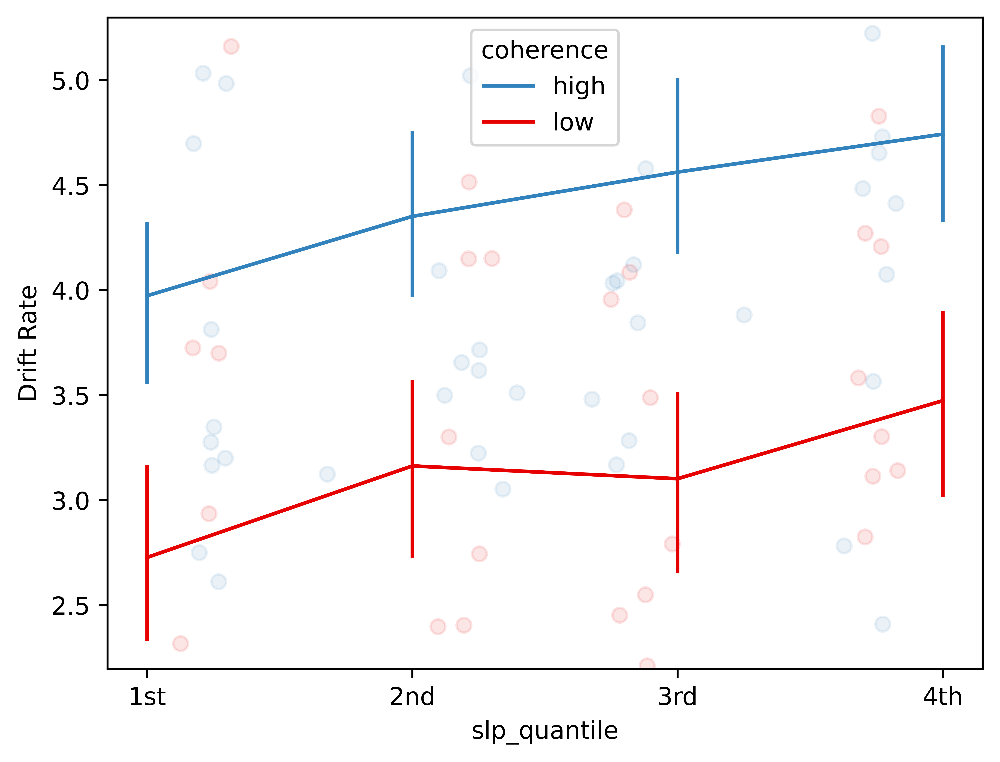

In [255]:
plt.subplots(dpi=1000)

plt.scatter(dfs2ddm_slp[dfs2ddm_slp['coherence'] == 'low'].slp+1.5,dfs2ddm_slp[dfs2ddm_slp['coherence'] == 'low'].v,color='#e60000',alpha=0.1)
plt.scatter(dfs2ddm_slp[dfs2ddm_slp['coherence'] == 'high'].slp+1.5,dfs2ddm_slp[dfs2ddm_slp['coherence'] == 'high'].v,color='#3182bd',alpha=0.1)
sns.lineplot(x='slp_quantile',y='v',hue='coherence',data=dfs2ddm_slp,err_style='bars',ci=68,palette=['#3182bd','#e60000'],legend=True)
#plt.plot(dfs2ddm_slp[dfs2ddm_slp['coherence'] == 'low'].slp,dfs2ddm_slp[dfs2ddm_slp['coherence'] == 'low'].v,color='#3182bd',alpha=0.1)
#plt.plot(dfs2ddm_slp[dfs2ddm_slp['coherence'] == 'high'].slp,dfs2ddm_slp[dfs2ddm_slp['coherence'] == 'high'].v,color='#e60000',alpha=0.1)
#plt.errorbar(dfs2ddm_slp[dfs2ddm_slp['coherence'] == 'low'].slp,dfs2ddm_slp[dfs2ddm_slp['coherence'] == 'low'].v,yerr=dfs2ddm_slp[dfs2ddm_slp['coherence'] == 'low'].v.std(),color='#3182bd',alpha=0.1)
#plt.errorbar(dfs2ddm_slp[dfs2ddm_slp['coherence'] == 'high'].slp,dfs2ddm_slp[dfs2ddm_slp['coherence'] == 'high'].v,yerr=dfs2ddm_slp[dfs2ddm_slp['coherence'] == 'high'].v.std(),color='#e60000',alpha=0.1)

plt.ylabel('Drift Rate')

plt.show()

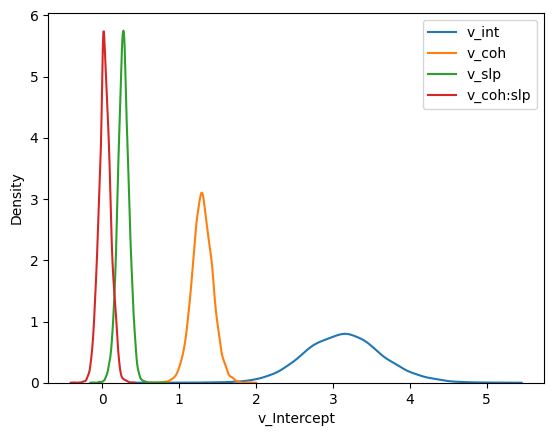

In [256]:
sns.kdeplot(m5slp.filter(regex='^v_(?!.*(std|sub)).*$').iloc[:,0],label='v_int')
sns.kdeplot(m5slp.filter(regex='^v_(?!.*(std|sub)).*$').iloc[:,1],label='v_coh')
sns.kdeplot(m5slp.filter(regex='^v_(?!.*(std|sub)).*$').iloc[:,2],label='v_slp')
sns.kdeplot(m5slp.filter(regex='^v_(?!.*(std|sub)).*$').iloc[:,3],label='v_coh:slp')
plt.legend()

0.2727614815894948